# Information Visualisation Project


In [1]:
import numpy as np
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from nltk.corpus import stopwords
from nltk import sent_tokenize
from nltk.tokenize import word_tokenize
import re
from mpl_toolkits.axes_grid1 import ImageGrid
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv1D, MaxPool1D, BatchNormalization, Dropout, LSTM, Embedding, GlobalMaxPool1D, Reshape
from keras.utils.vis_utils import plot_model
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, confusion_matrix
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from tabulate import tabulate
import plotly.graph_objects as go
from ipywidgets import widgets
import plotly.io as pio

# Information about the dataset chosen
The goal of the project is to present different types of data visualization applied on a specific dataset.

For the project, we chose a dataset that contains information about 28371 songs published between 1950 and 2019. For each song, the following details can be found in the initial dataset: 
- the name of the artist and the name of each song
- the release year
- the genre and the main topic of each song - categorical features
- the lyrics of each song
- numerical data like the length of the song and other audio characteristics that are obtained using Echo Nest® API integrated engine with Spotify Python’s package (in total 24). 

The initial dataset can be found here: https://data.mendeley.com/datasets/3t9vbwxgr5/2

# Style

We chosed the themes for the graphical libraries so they are similar to each other.
Seaborn's theme was used as default for the matplotlib charts.
The "seaborn" theme was used for plotly so the colors are as close as possible.

In [2]:
sns.set_theme()
pio.templates.default = "seaborn"

In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


In [4]:
df = pd.read_csv('tcc_ceds_music.csv')

# Static charts and analysis

We checked the distribution of songs over genres to see how balanced the initial dataset is. 
To achieve this, bar charts and pie charts were used. 


Initially, we chose to analyze the distribution of songs over the genres.
The 'hip hop' genre is very low populated compared to all the other genres (just 3%) while the 'pop' genre is slightly overpopulated.

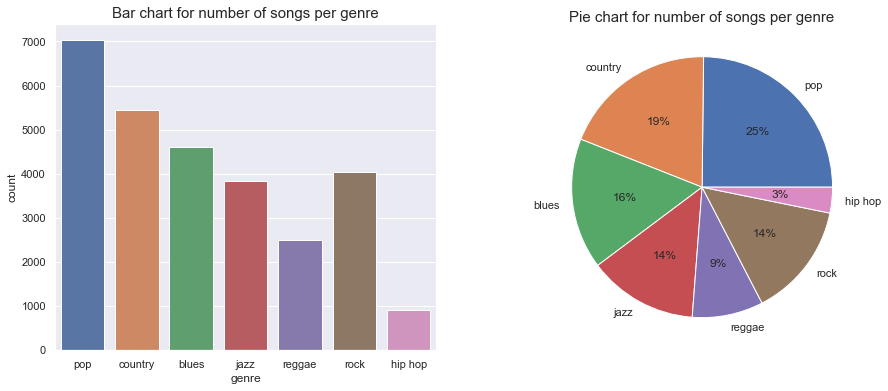

In [5]:
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.title("Bar chart for number of songs per genre", size = 15)
sns.countplot(x='genre',data=df)

list_genres = ['pop', 'country', 'blues', 'jazz', 'reggae', 'rock', 'hip hop']

count_genres = { 'name': [],
                 'count': [] }
for genre in list_genres:
    count_genres['name'].append(genre)
    count_genres['count'].append(df['genre'].value_counts()[genre])

plt.subplot(1, 2, 2)
plt.title("Pie chart for number of songs per genre", size = 15, pad=2.0)
plt.pie(count_genres['count'], labels= count_genres['name'], autopct='%.0f%%')
print()

We chose to analyze the distribution of the songs over the years. For this we used a bar chart for the count of the songs from the dataset from each year. Afterwards we chose to represent the data into decades (ex: the 1950' decade has the songs between 1950 and 1959), on which we applied a bar chart and a pie chart.

As it can be seen below, The number of songs is slightly increasing over time. For the first 10 to 15 years, the number of songs is relatively small. This is also highlighted by the small count for the 1950' decade (just 5% of the total).

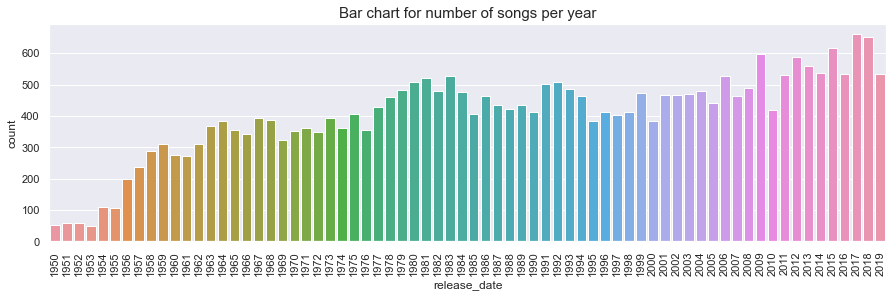

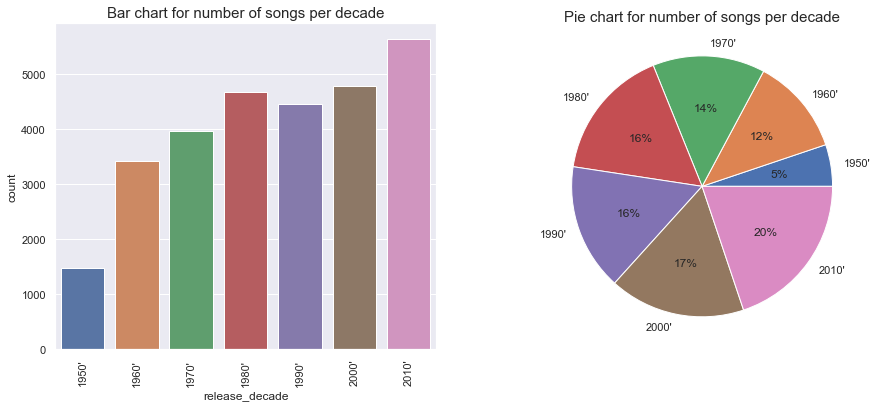

In [6]:
plt.figure(figsize=(15,4))
plt.title("Bar chart for number of songs per year", size = 15)
sns.countplot(x='release_date',data=df)
plt.xticks(rotation=90)
plt.show()


df['release_decade'] = df.apply(lambda row: str(int(row.release_date / 10) * 10) + "'", axis = 1)

    
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.title("Bar chart for number of songs per decade", size = 15)
sns.countplot(x='release_decade',data=df)
plt.xticks(rotation=90)

count_release_decade = { 'name': [],
                         'count': [] }
list_release_decades = ["1950'", "1960'", "1970'", "1980'", "1990'", "2000'", "2010'"]

for release_decade in list_release_decades:
    count_release_decade['name'].append(release_decade)
    count_release_decade['count'].append(df['release_decade'].value_counts()[release_decade])
    
plt.subplot(1, 2, 2)
plt.title("Pie chart for number of songs per decade", size = 15, pad=2.0)
plt.pie(count_release_decade['count'], labels= count_release_decade['name'], autopct='%.0f%%')

print()

 We chose to analyze the distribution of the songs over the different topics - the initial data being classified in 8 different topics. To visualize the data we chose the same approach as above.
 
 The songs that belong to the topics: 'sadness', 'world/life', 'violence' and 'obscene' constitute 78% of the total data. 

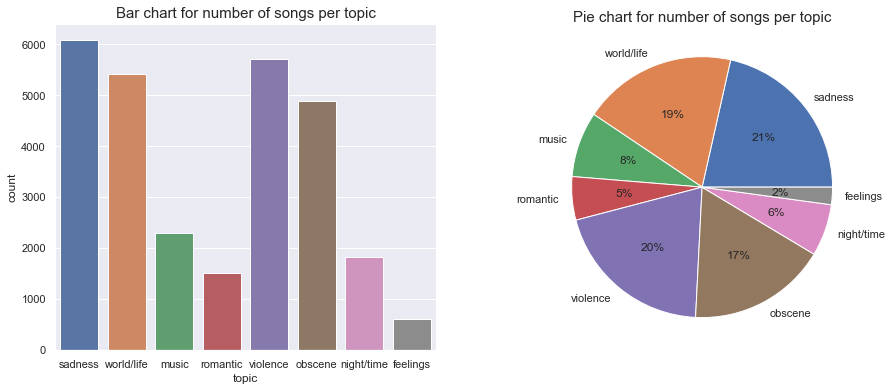

In [7]:
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.title("Bar chart for number of songs per topic", size = 15)
sns.countplot(x='topic',data=df)

list_topics = ['sadness', 'world/life', 'music', 'romantic', 'violence', 'obscene', 'night/time', 'feelings']

count_topics = { 'name': [],
                 'count': [] }

for topic in list_topics:
    count_topics['name'].append(topic)
    count_topics['count'].append(df['topic'].value_counts()[topic])

plt.subplot(1, 2, 2)
plt.title("Pie chart for number of songs per topic", size = 15, pad=2.0)
plt.pie(count_topics['count'], labels= count_topics['name'], autopct='%.0f%%')
print()


We wanted to visualize the most common words in each genre just to see if we can observe a clear pattern and if the pattern is similar to the prior, real-world knowledge. For this, we chose word clouds.

We encountered multiple problems here. One of the most difficult problems found was the appearance of duplicates for several words for the same chart. We discovered later that these duplicates were correctly shown because the collocations were not deactivated/removed. We fixed this afterwards.

We saw that a lot of the genres share a similar vocabulary which might indicate that features extracted from lyrics might not be the best one for a genre classifier.

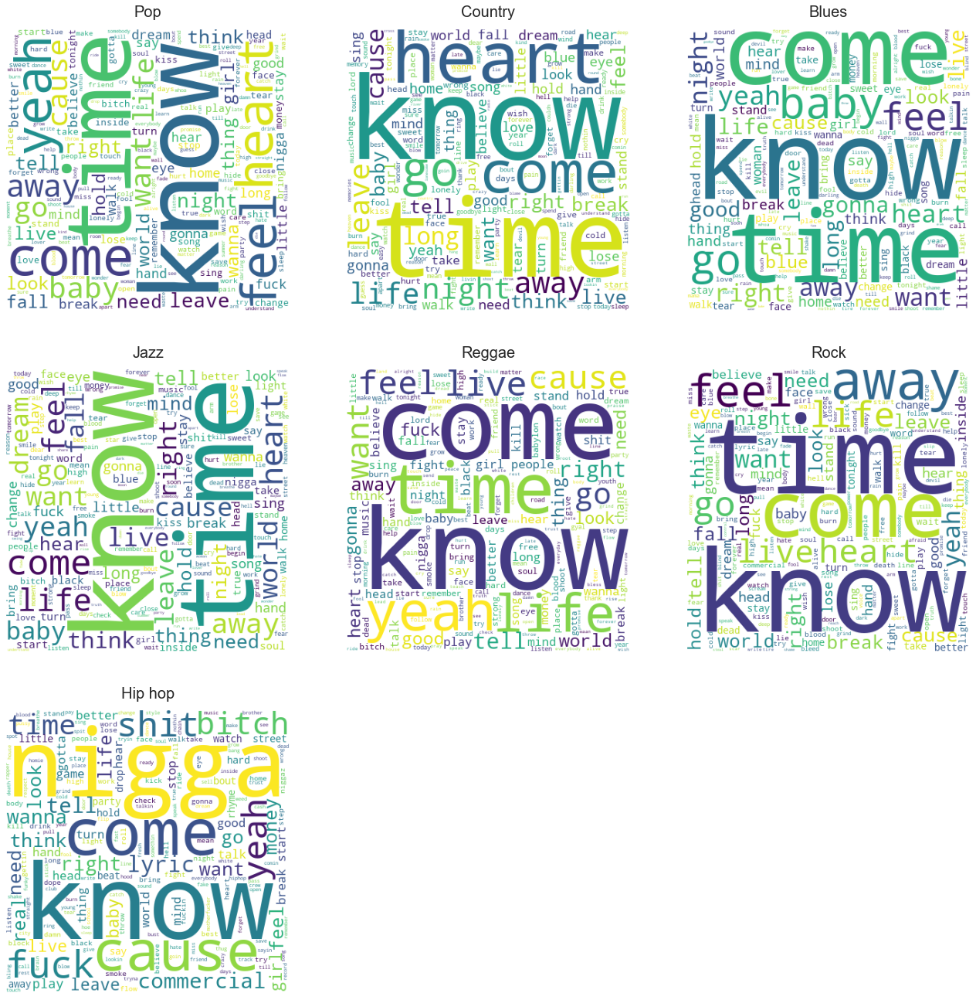

In [8]:
def empty_image(height=400, width=400):
    empty_img = np.zeros([height,width,3],dtype=np.uint8)
    empty_img.fill(255)
    return(empty_img)

dict_genres_words = {}
for genre in list_genres:
    dict_genres_words[genre] = ' '.join(df[df.genre == genre].lyrics.values)
    
wordcloud_figures = []
figure_titles = []
for genre in dict_genres_words:
    figure_titles.append(genre.capitalize())
    wordcloud_figures.append(WordCloud(width=400, height=400, background_color='white', repeat=False, collocations=False).generate(dict_genres_words[genre]))

fig = plt.figure(1,(23, 23))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 3), axes_pad=1, share_all=True)
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])

# grid.set_title("Word clouds for genres")
for i in range(len(list_genres)):
    grid[i].imshow(wordcloud_figures[i])
    grid[i].set_title(figure_titles[i], size=20, pad=15.0)

grid[7].imshow(empty_image())
grid[8].imshow(empty_image())
print()

We wanted to perform the same analysis as above with respect to two other aspects: the topic and the decade when it was recorded. We believe, based on the analysis of the words in each topic, that for labelling the songs a glossary-based approach was implemented by the creator of the dataset.

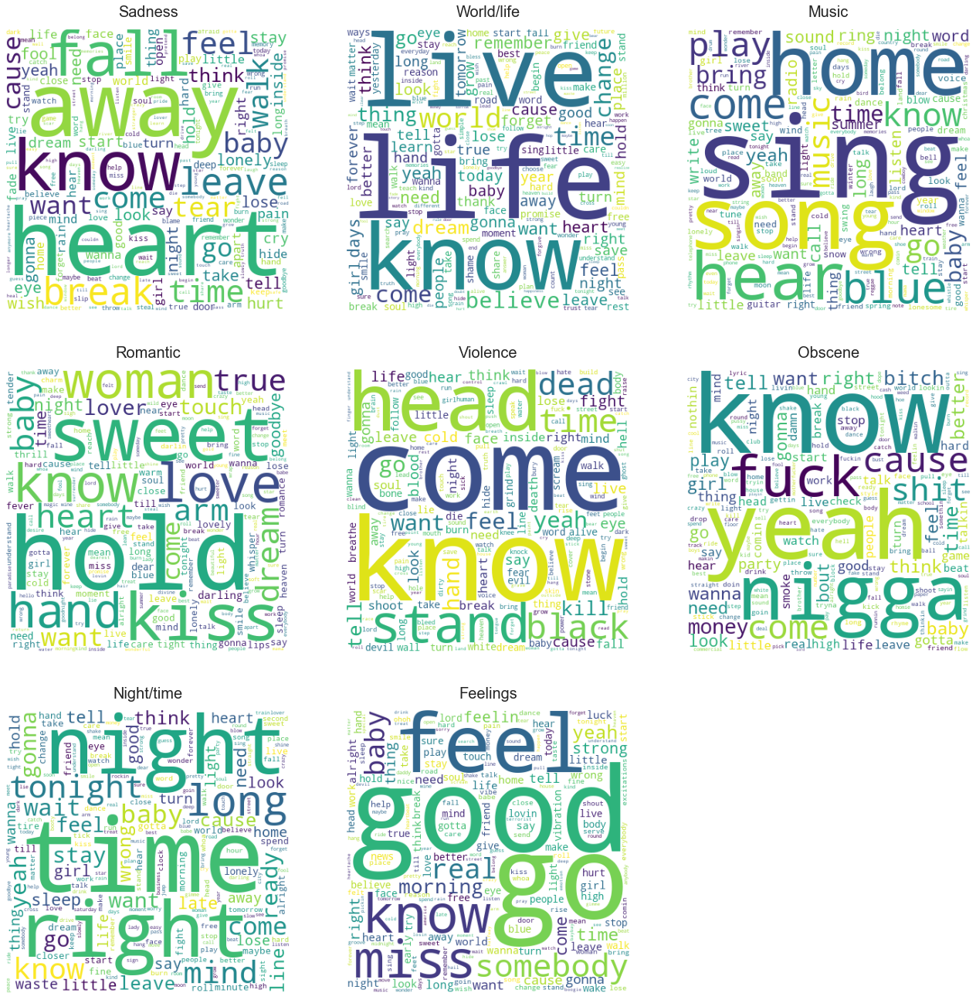

In [9]:
dict_topics_words = {}
for topic in list_topics:
    dict_topics_words[topic] = ' '.join(df[df.topic == topic].lyrics.values)
    
wordcloud_figures = []
figure_titles = []
for topic in dict_topics_words:
    figure_titles.append(topic.capitalize())
    wordcloud_figures.append(WordCloud(width=400, height=400, background_color='white', repeat=False, collocations=False).generate(dict_topics_words[topic]))

fig = plt.figure(1,(23, 23))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 3), axes_pad=1, share_all=True)
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])
for i in range(len(list_topics)):
    grid[i].imshow(wordcloud_figures[i])
    grid[i].set_title(figure_titles[i], size = 20, pad=15.0)
    
grid[8].imshow(empty_image())
print()

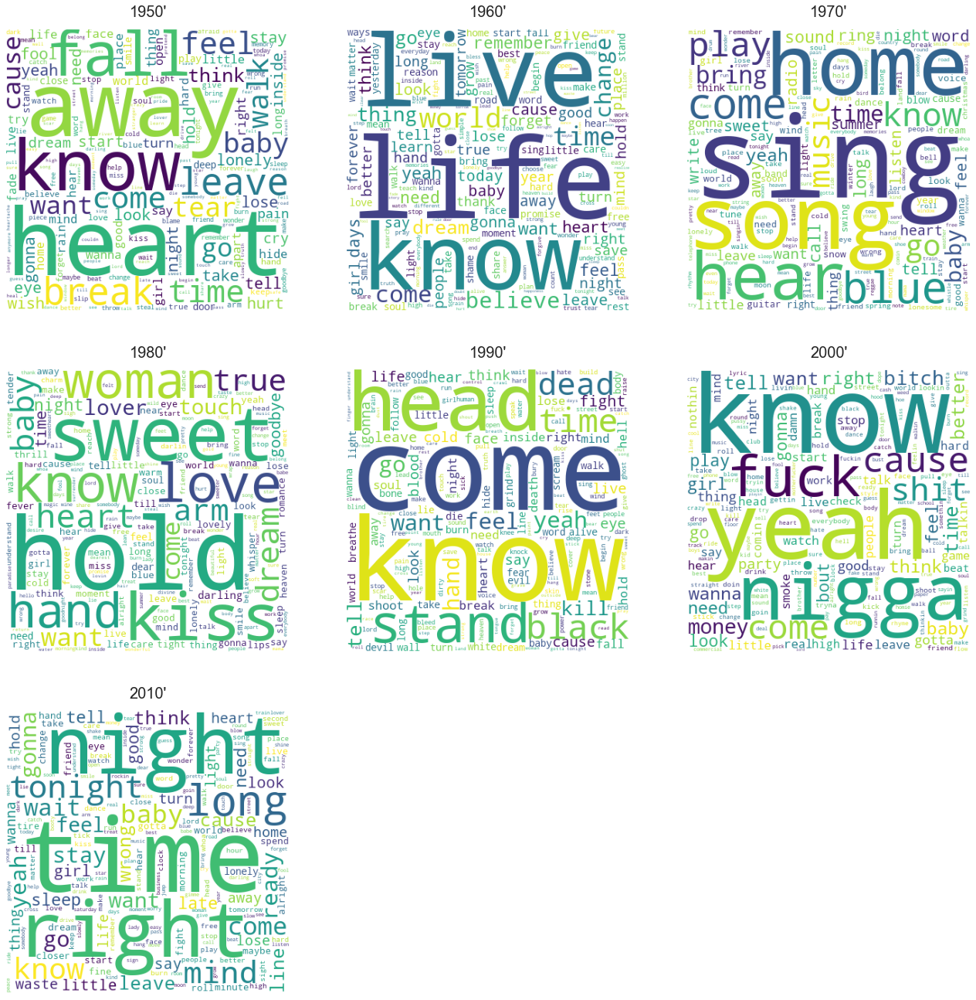

In [10]:
dict_release_decades_words = {}
for release_decade in list_release_decades:
    dict_release_decades_words[release_decade] = ' '.join(df[df.release_decade == release_decade].lyrics.values)
    
for release_decade in list_release_decades:
    wordcloud_figures.append(WordCloud(width=400, height=400, background_color='white', repeat=False, collocations = False).generate(dict_release_decades_words[release_decade]))

fig = plt.figure(1,(23, 23))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 3), axes_pad=1, share_all=True)
grid[0].get_yaxis().set_ticks([])
grid[0].get_xaxis().set_ticks([])
for i in range(len(list_release_decades)):
    grid[i].imshow(wordcloud_figures[i])
    grid[i].set_title(list_release_decades[i], size = 20, pad=15.0)
    
grid[7].imshow(empty_image())
grid[8].imshow(empty_image())
print()

We looked more in-depth at the distribution of the topics in each genre. The distribution is similar for most of the genres, except for "hip hop" which contains songs that are mostly labelled as "obscene". Moreover, we believe that the "feelings" topic was wrongly described when labelling (because the topic is very under-populated, a strange thing for such a great number of songs). 

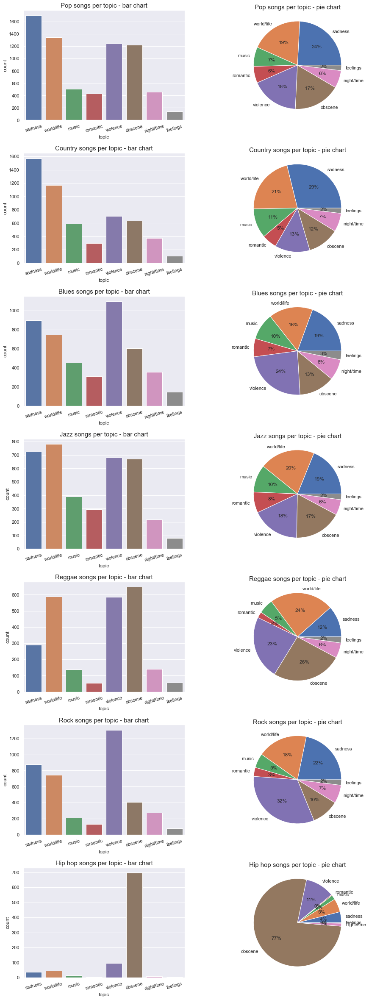

In [11]:
plt.figure(figsize=(15, 42))
plt.subplots_adjust(hspace=0.3)

for i in range(len(list_genres)):
    plt.subplot(len(list_genres),2,i*2+1)
    sns.countplot(x='topic',data=df[df.genre == list_genres[i]], order = list_topics)
    plt.xticks(rotation=15)
    plt.title(list_genres[i].capitalize() + " songs per topic - bar chart", size = 15)
    
    plt.subplot(len(list_genres),2,i*2+2)
    count_topics = { 'name': [],
                     'count': [] }

    for topic in list_topics:
        count_topics['name'].append(topic)
        count_topics['count'].append(df['topic'].loc[df['genre'] == list_genres[i]].value_counts()[topic])

    plt.title(list_genres[i].capitalize() + " songs per topic - pie chart", size = 15, pad=2.0)
    plt.pie(count_topics['count'], labels= count_topics['name'], autopct='%.0f%%')
print()

We tried a similar approach for the distribution of genres for each topic. However, because of the very high number of songs in the "pop" class, it didn't lead to very interesting conclusions.

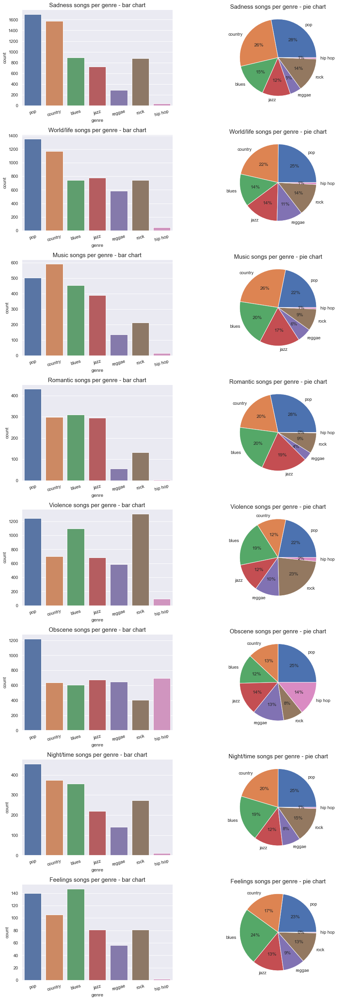

In [12]:
plt.figure(figsize=(15, (len(list_topics) +1) * 5))
plt.subplots_adjust(hspace=0.3)

for i in range(len(list_topics)):
    plt.subplot(len(list_topics),2,i*2+1)
    sns.countplot(x='genre',data=df[df.topic == list_topics[i]], order = list_genres)
    plt.xticks(rotation=15)
    plt.title(list_topics[i].capitalize() + " songs per genre - bar chart", size = 15)
    
    plt.subplot(len(list_topics),2,i*2+2)
    count_genres = { 'name': [],
                     'count': [] }

    for genre in list_genres:
        count_genres['name'].append(genre)
        count_genres['count'].append(df['genre'].loc[df['topic'] == list_topics[i]].value_counts()[genre])

    plt.title(list_topics[i].capitalize() + " songs per genre - pie chart", size = 15, pad=2.0)
    plt.pie(count_genres['count'], labels= count_genres['name'], autopct='%.0f%%')
print()

For more insight we tried to unify the last two directions that we developed into one view - using a heatmap.

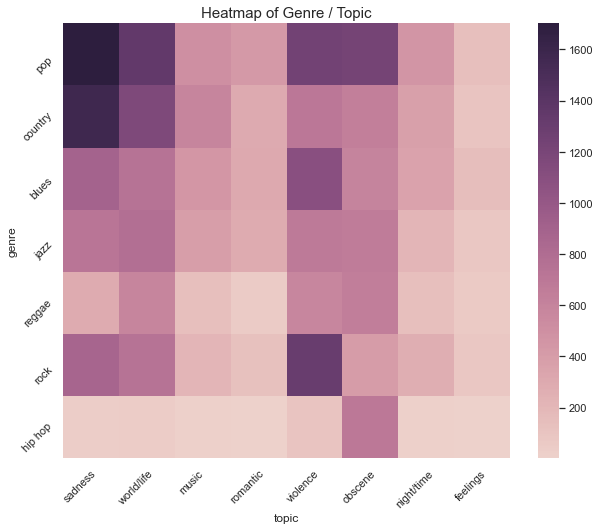

In [13]:
heatmap_genre_emotion = np.zeros((len(df['genre'].unique()), len(df['topic'].unique())))

unique_genre = list(df['genre'].unique())
unique_topic = list(df['topic'].unique())

for genre, topic in zip(df['genre'], df['topic']):
    heatmap_genre_emotion[unique_genre.index(genre), unique_topic.index(topic)] += 1

plt.figure(figsize = (10,8))
plt.title("Heatmap of Genre / Topic", size=15)
ax = sns.heatmap(heatmap_genre_emotion, cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_xlabel("topic")
ax.set_ylabel("genre")
c = ax.set_yticks(np.arange(len(unique_genre))+0.65, unique_genre, rotation=45)
c = ax.set_xticks(np.arange(len(unique_topic))+0.3, unique_topic, rotation=45)

We explored the distribution of the genres and topics in time. We opted for three different visualization methods as each of them was providing a different point of view.

We understood that, in fact, the "hip hop" genre is not under-represented by mistake but was only created in the mid-70s.

Moreover, we were able to see a snapshot of the volume of songs for genres in different stages of development: the developing genres are starting from a relatively low number of songs and tend to reach equilibrium after around 30/40 years (Rock, created in the 50s was able to reach equilibrium after 30 years). 

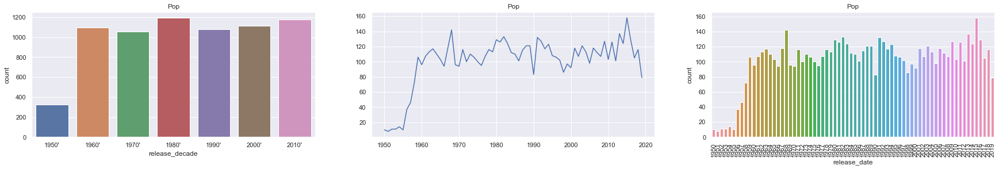

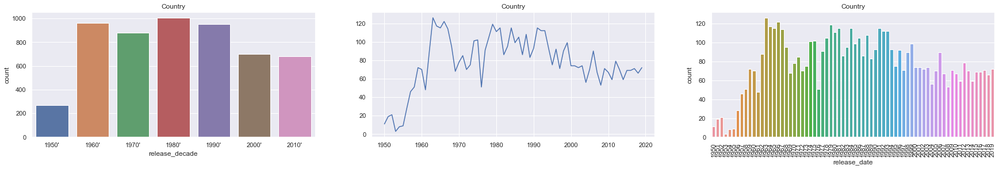

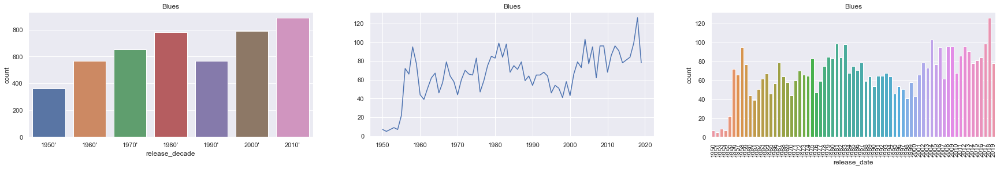

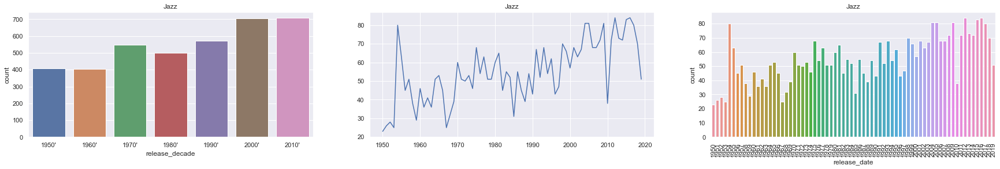

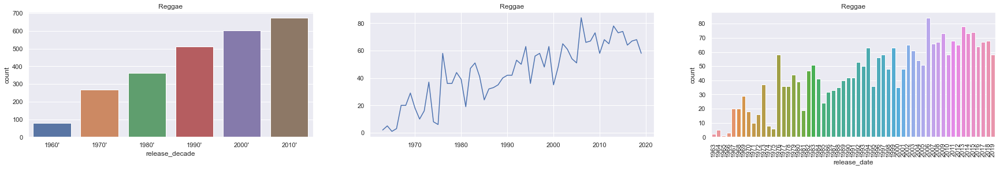

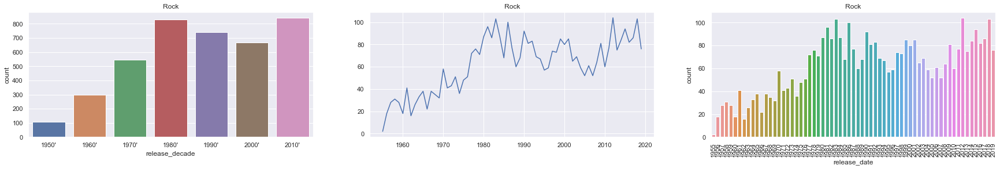

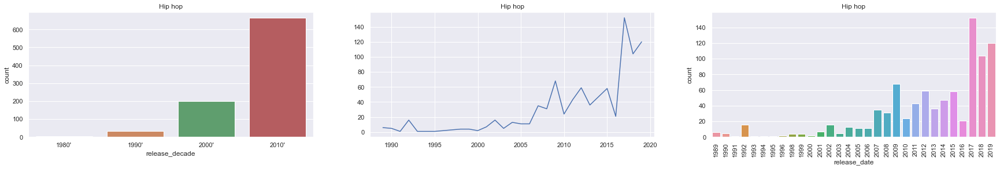

In [14]:
for i in range(len(list_genres)):
    fig, ax =plt.subplots(1,3, figsize=(30,4))
    df_genre = df[df.genre == list_genres[i]]
    
    plt.title(list_genres[i].capitalize())
    sns.countplot(x='release_decade',data=df_genre, ax=ax[0])
    ax[0].title.set_text(list_genres[i].capitalize())
    
    counts = df_genre['release_date'].value_counts(sort=False)
    sns.lineplot(x=counts.index, y=counts.values, ax=ax[1])
    ax[1].title.set_text(list_genres[i].capitalize())
    plt.xticks(rotation=90)
    sns.countplot(x='release_date',data=df_genre, ax=ax[2])
    plt.show()

We explored in the same way, the distribution of topics in time. It is interesting to see the music trends over the years.

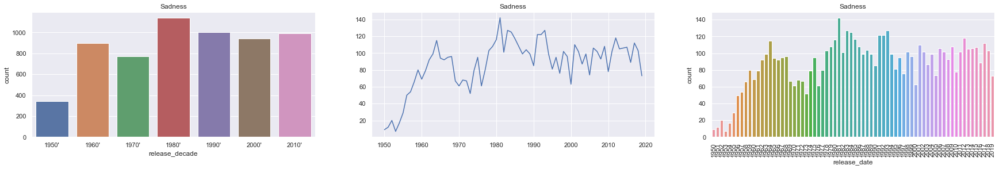

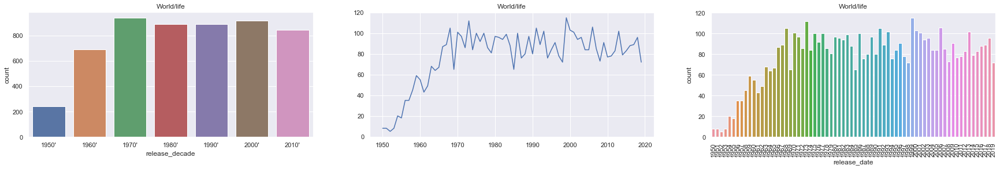

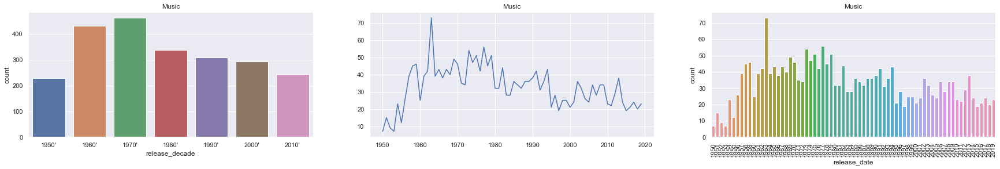

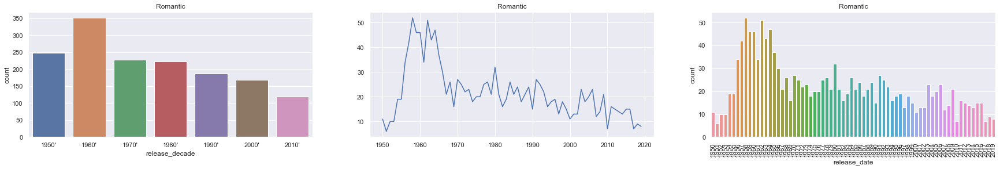

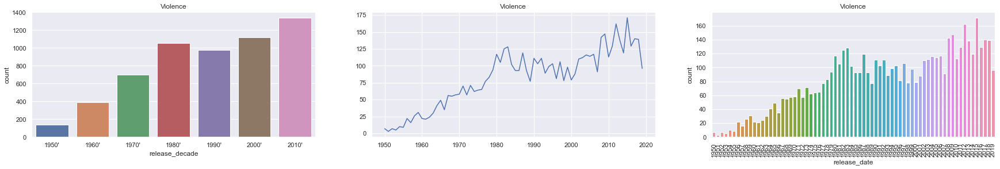

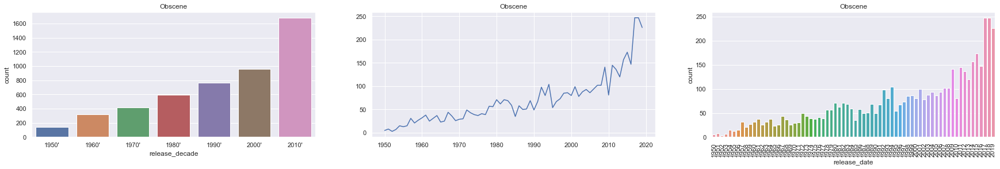

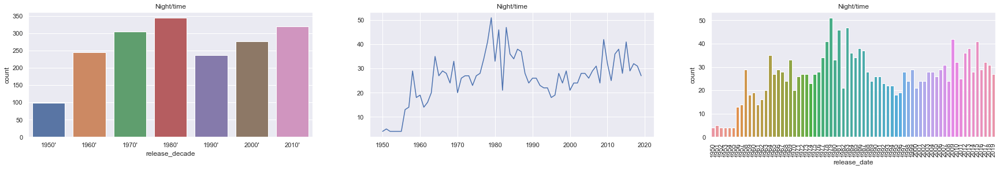

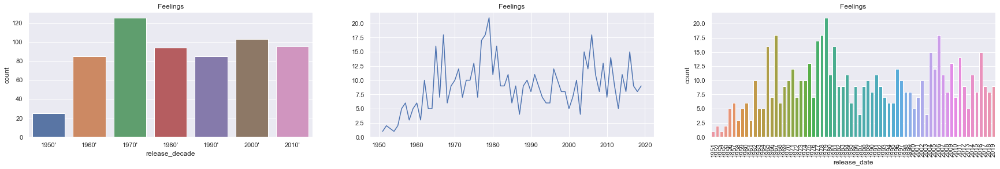

In [15]:
for i in range(len(list_topics)):
    fig, ax =plt.subplots(1,3, figsize=(30,4))
    df_topic = df[df.topic == list_topics[i]]
    
    plt.title(list_topics[i].capitalize())
    sns.countplot(x='release_decade',data=df_topic, ax=ax[0])
    ax[0].title.set_text(list_topics[i].capitalize())
    
    counts = df_topic['release_date'].value_counts(sort=False)
    sns.lineplot(x=counts.index, y=counts.values, ax=ax[1])
    ax[1].title.set_text(list_topics[i].capitalize())
    plt.xticks(rotation=90)
    sns.countplot(x='release_date',data=df_topic, ax=ax[2])
    plt.show()

We tried to extract directly from the EDA some features that can be considered definitory for each genre and topic. For this we applied boxplots and violin plots on the numerical features for each genre and topic.

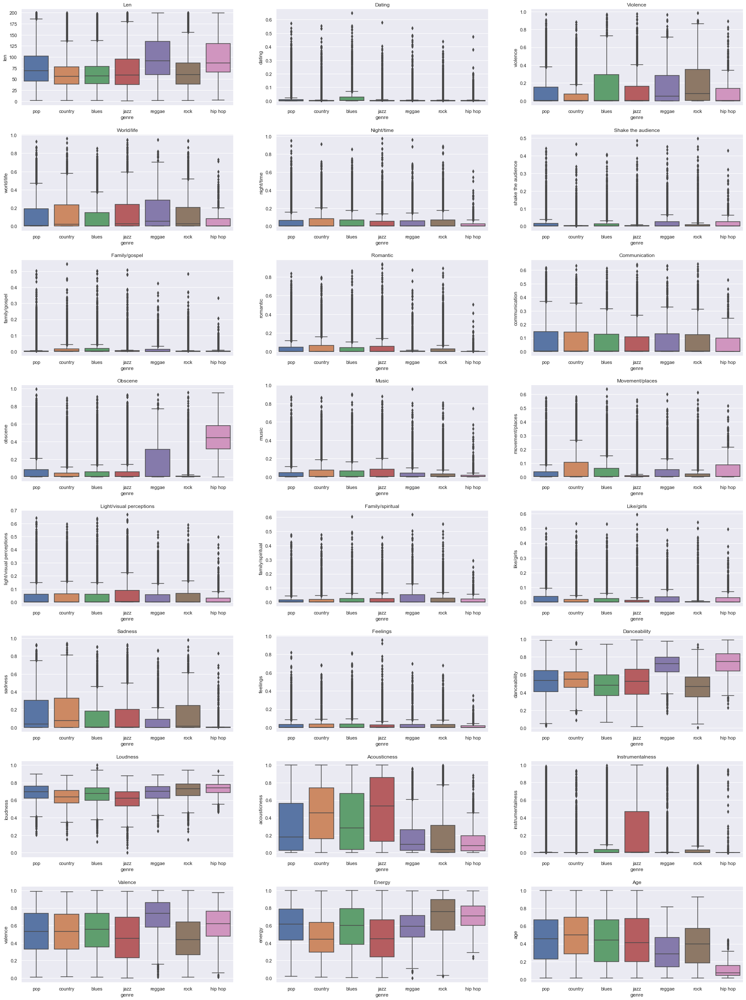

In [16]:
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']
fig, ax = plt.subplots(8,3, figsize=(30,32))
for i in range(len(features)):
    sns.boxplot(x="genre", y=features[i], data=df, ax = ax[int(i/3)][i%3])
    ax[int(i/3)][i%3].title.set_text(features[i].capitalize())
    plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.3)

plt.show()

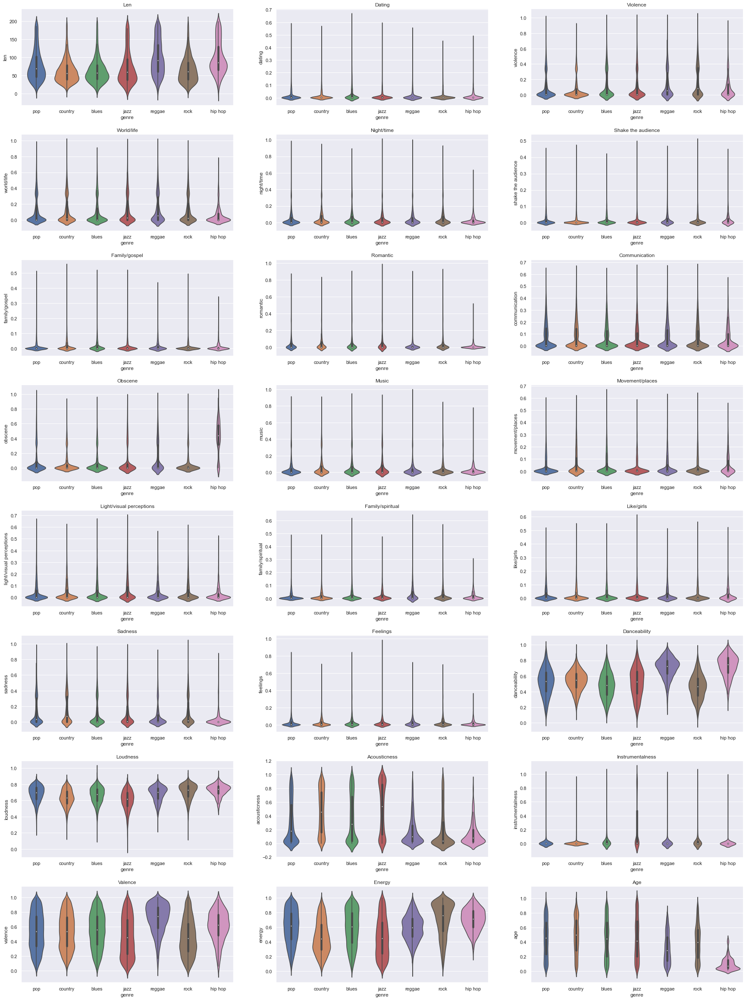

In [17]:
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']
fig, ax = plt.subplots(8,3, figsize=(30,32))
for i in range(len(features)):
    sns.violinplot(x="genre", y=features[i], data=df, ax = ax[int(i/3)][i%3])
    ax[int(i/3)][i%3].title.set_text(features[i].capitalize())
    plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.3)

plt.show()

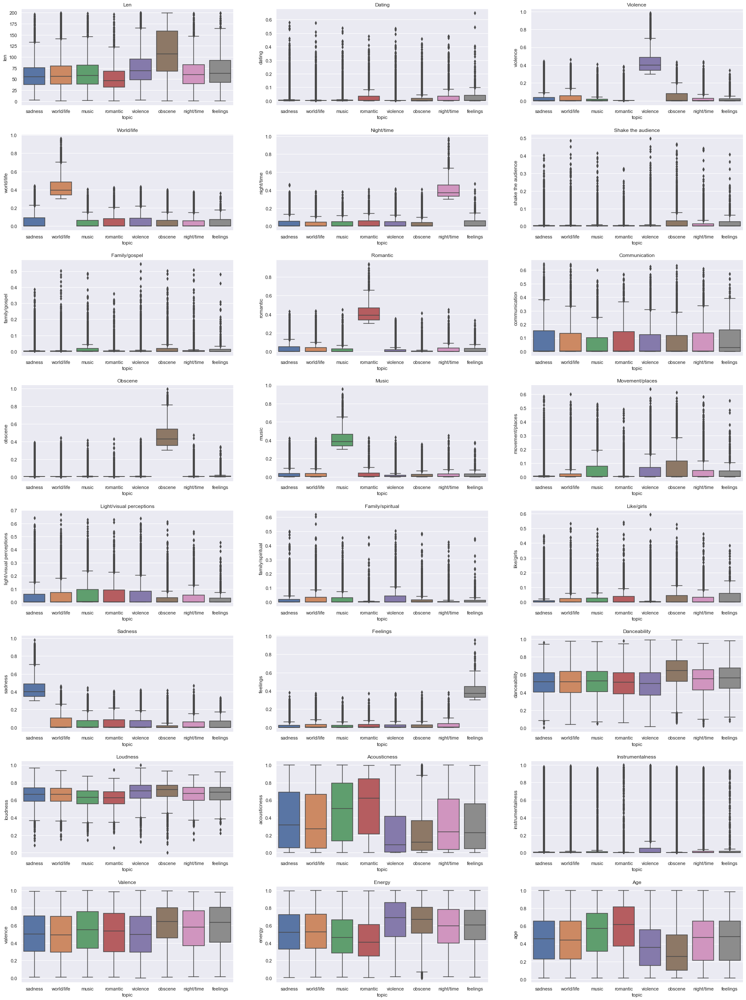

In [18]:
fig, ax = plt.subplots(8,3, figsize=(30,32))
for i in range(len(features)):
    sns.boxplot(x="topic", y=features[i], data=df, ax = ax[int(i/3)][i%3])
    ax[int(i/3)][i%3].title.set_text(features[i].capitalize())
    plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.3)

plt.show()

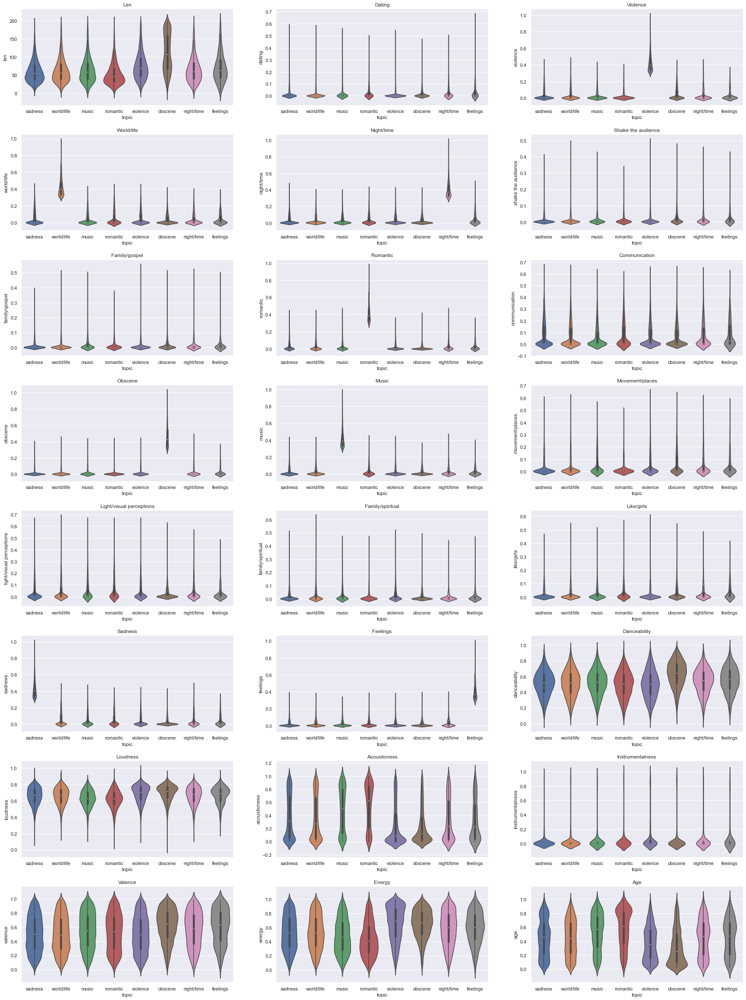

In [19]:
fig, ax = plt.subplots(8,3, figsize=(30,32))
for i in range(len(features)):
    sns.violinplot(x="topic", y=features[i], data=df, ax = ax[int(i/3)][i%3])
    ax[int(i/3)][i%3].title.set_text(features[i].capitalize())
    plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.3)

plt.show()

We wanted to see how those characteristics changed over the years - if those can represent useful features for a classifier over the release decades of the songs.

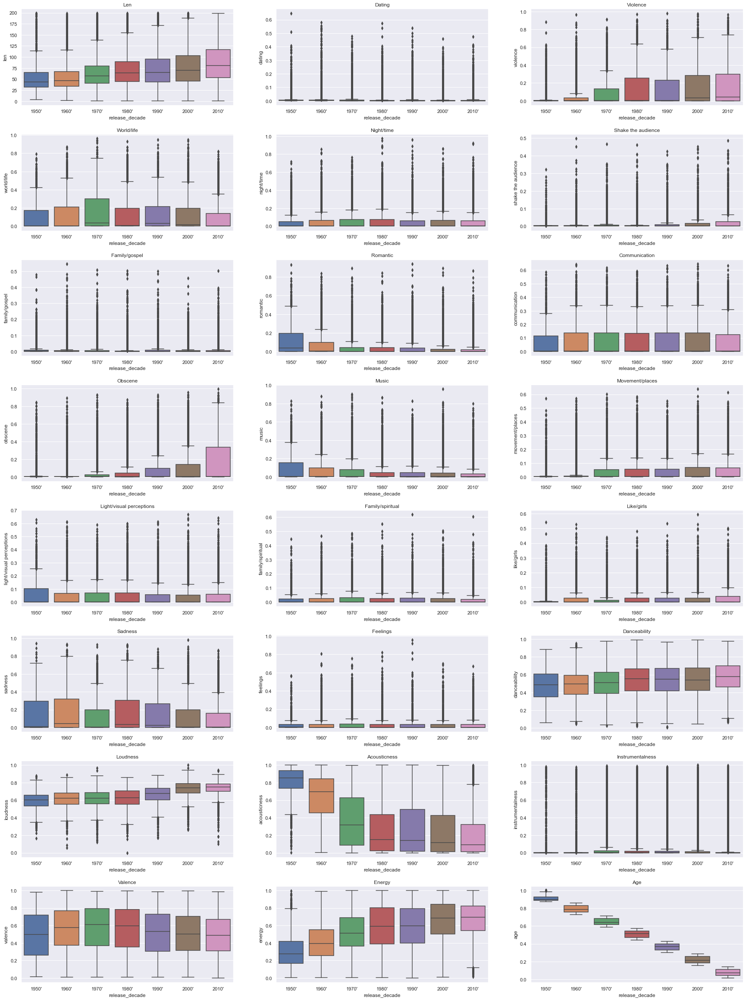

In [20]:
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']
fig, ax = plt.subplots(8,3, figsize=(30,32))
for i in range(len(features)):
    sns.boxplot(x="release_decade", y=features[i], data=df, ax = ax[int(i/3)][i%3])
    ax[int(i/3)][i%3].title.set_text(features[i].capitalize())
    plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.3)

plt.show()

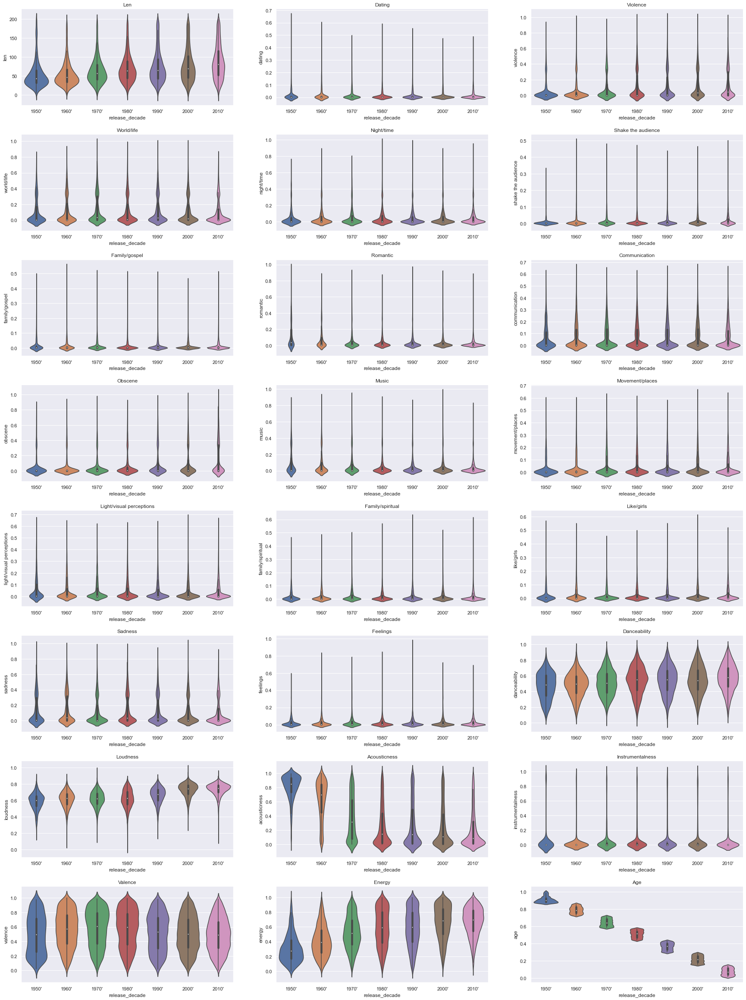

In [21]:
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']
fig, ax = plt.subplots(8,3, figsize=(30,32))
for i in range(len(features)):
    sns.violinplot(x="release_decade", y=features[i], data=df, ax = ax[int(i/3)][i%3])
    ax[int(i/3)][i%3].title.set_text(features[i].capitalize())
    plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.3)

plt.show()

We also tried to create some "identity cards" (radar charts/spider charts) for each of the genres and topics to be able to compare them and to more easily visualize the differences. 

The data used in the radar charts represents the mean value of each feature divided by the maximum mean value found across all the genres/topics.

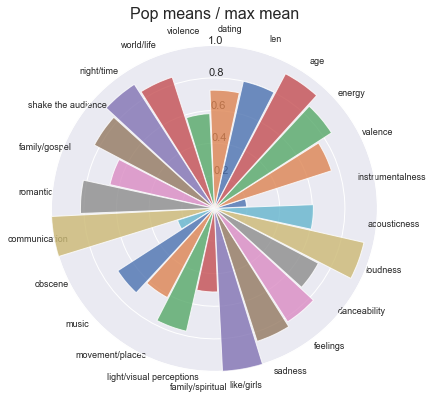

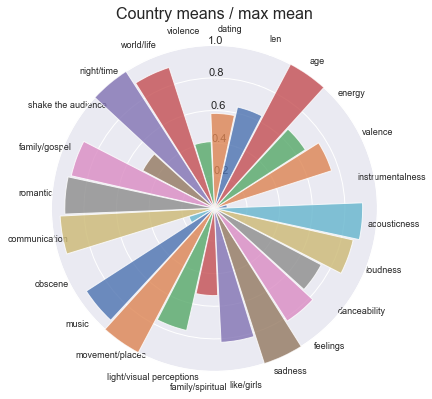

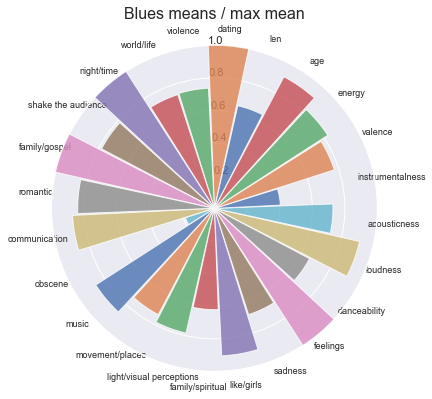

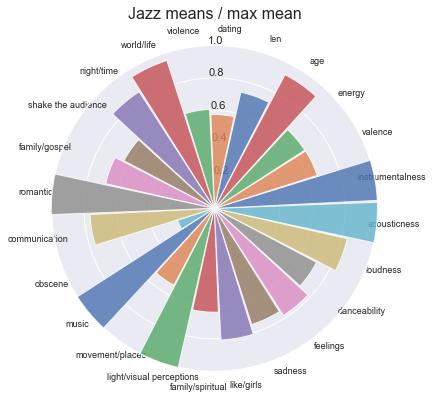

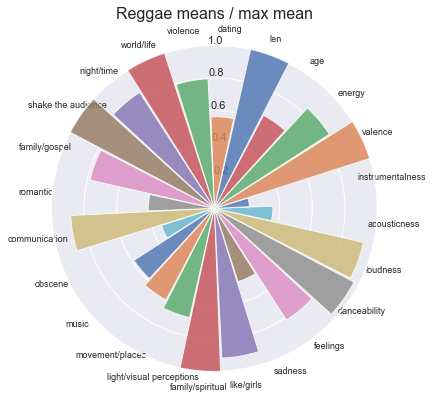

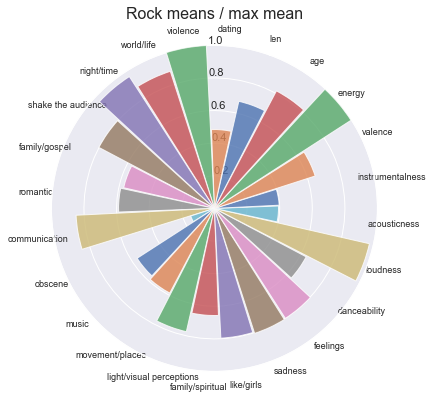

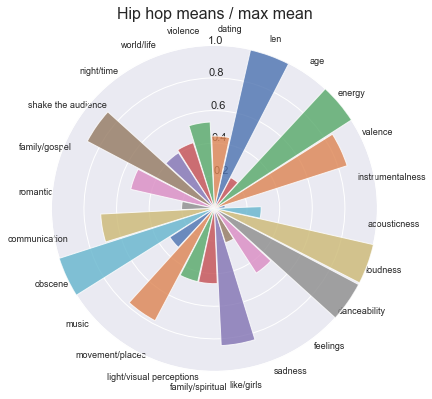

In [22]:
# Create the data
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']

max_mean = {}
for feature in features:
    max_mean[feature] = 0

mean_features = {}
for i in range(len(list_genres)):
    genre = list_genres[i]
    mean_features[genre] = { 'name': [],
                             'mean': [] }
    for feature in features:
        mean_features[genre]['name'].append(feature)
        mean = df[feature].loc[df['genre'] == list_genres[i]].mean()
        mean_features[genre]['mean'].append(mean)
        if max_mean[feature] < mean:
            max_mean[feature] = mean

for i in range(len(list_genres)): 
    genre = list_genres[i]
    for i in range(len(features)):
        mean_features[genre]['mean'][i] = mean_features[genre]['mean'][i] / max_mean[features[i]]


# Create the plots

# colors = ['#6c5b7b', '#88617e', '#a36681', '#bd6b84', '#da6f82', '#f67280', '#f78988', '#f79e8f', '#f8b195']
colors = sns.color_palette()

angles = [n / float(len(features)) * 2 * np.pi for n in range(len(features))]

for genre in list_genres:
    lenghts = mean_features[genre]['mean']

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={"projection": "polar"})
    fig.patch.set_facecolor("white")
    ax.set_theta_offset(np.deg2rad(70))
    ax.set_ylim(0, 1)
    ax.bar(angles, lenghts, color = colors, alpha=0.8, width=0.25, zorder=10)
    # ax.vlines(angles, 0, 1, color = "#1f1f1f", ls=(0, (4, 4)), zorder=11)


    ax.set_title(genre.capitalize() + " means / max mean", size = 16)
    ax.set_xticks(angles)
    ax.set_xticklabels(features, size = 9)


    ax.xaxis.grid(False)
    print()

    plt.show()

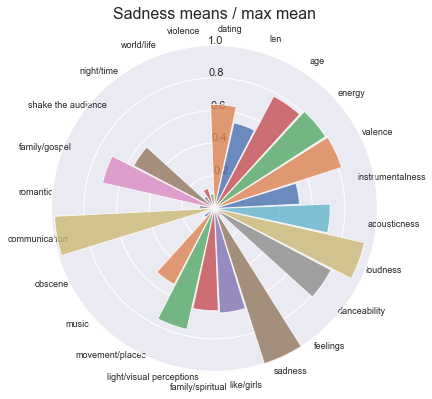

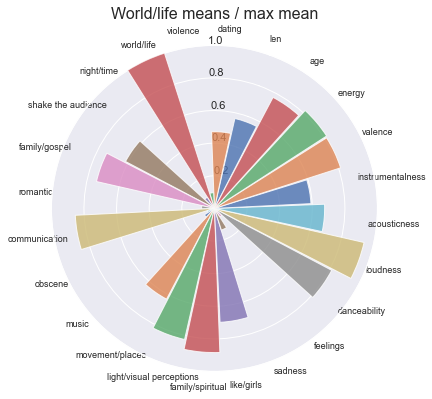

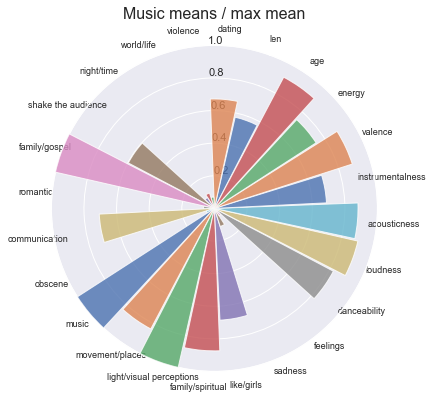

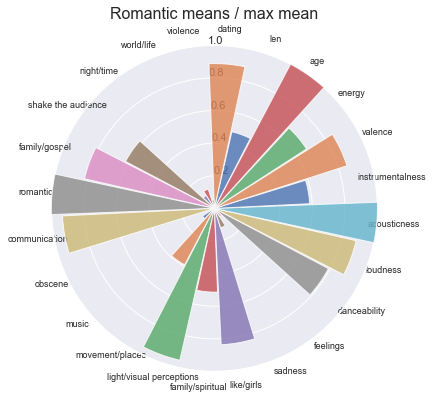

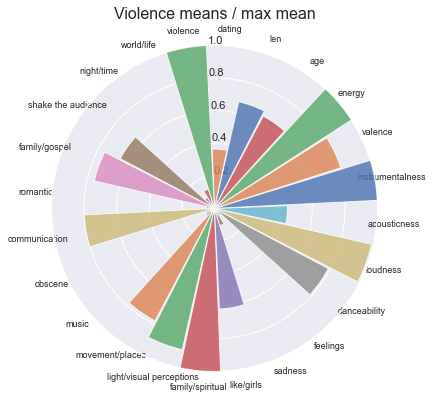

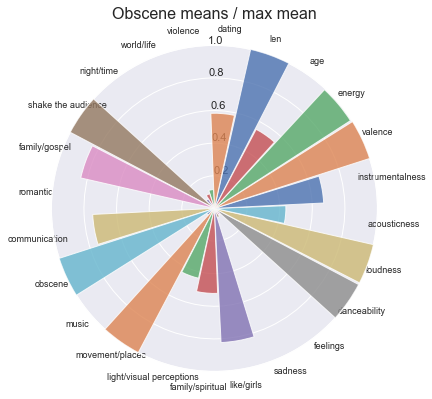

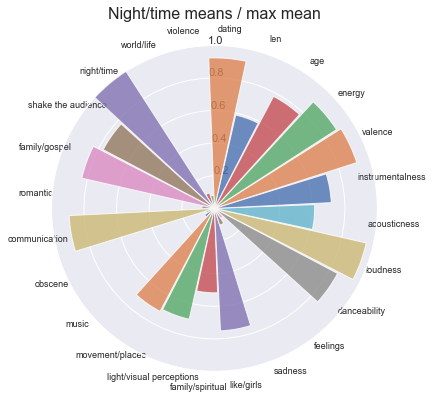

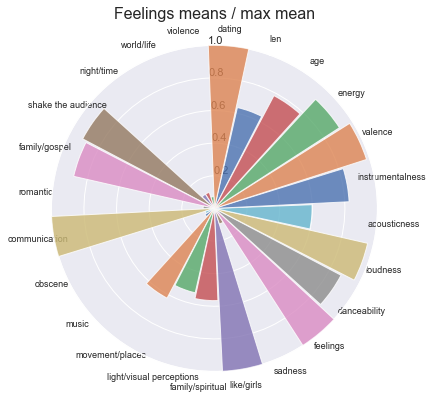

In [23]:
# Create the data
features = ['len', 'dating', 'violence', 'world/life', 'night/time', 'shake the audience', 'family/gospel', 'romantic', 'communication', 'obscene', 'music', 'movement/places', 'light/visual perceptions', 'family/spiritual', 'like/girls', 'sadness', 'feelings', 'danceability', 'loudness', 'acousticness', 'instrumentalness', 'valence', 'energy','age']

max_mean = {}
for feature in features:
    max_mean[feature] = 0

mean_features = {}
for i in range(len(list_topics)):
    topic = list_topics[i]
    mean_features[topic] = { 'name': [],
                             'mean': [] }
    for feature in features:
        mean_features[topic]['name'].append(feature)
        mean = df[feature].loc[df['topic'] == list_topics[i]].mean()
        mean_features[topic]['mean'].append(mean)
        if max_mean[feature] < mean:
            max_mean[feature] = mean

for i in range(len(list_topics)): 
    topic = list_topics[i]
    for i in range(len(features)):
        mean_features[topic]['mean'][i] = mean_features[topic]['mean'][i] / max_mean[features[i]]


# Create the plots

# colors = ['#6c5b7b', '#88617e', '#a36681', '#bd6b84', '#da6f82', '#f67280', '#f78988', '#f79e8f', '#f8b195']
colors = sns.color_palette()

angles = [n / float(len(features)) * 2 * np.pi for n in range(len(features))]

for topic in list_topics:
    lenghts = mean_features[topic]['mean']

    fig, ax = plt.subplots(figsize=(6, 6), subplot_kw={"projection": "polar"})
    fig.patch.set_facecolor("white")
    ax.set_theta_offset(np.deg2rad(70))
    ax.set_ylim(0, 1)
    ax.bar(angles, lenghts, color = colors, alpha=0.8, width=0.25, zorder=10)
    # ax.vlines(angles, 0, 1, color = "#1f1f1f", ls=(0, (4, 4)), zorder=11)


    ax.set_title(topic.capitalize() + " means / max mean", size = 16)
    ax.set_xticks(angles)
    ax.set_xticklabels(features, size = 9)


    ax.xaxis.grid(False)
    print()

    plt.show()

We also tried to analysed the genres based on how they are plotted in a 2-D space defined by two measurements. We wanted to extend this static chart to a dinamic one where the user should be able to select the measurements he wants to use but we came with this idea too late.

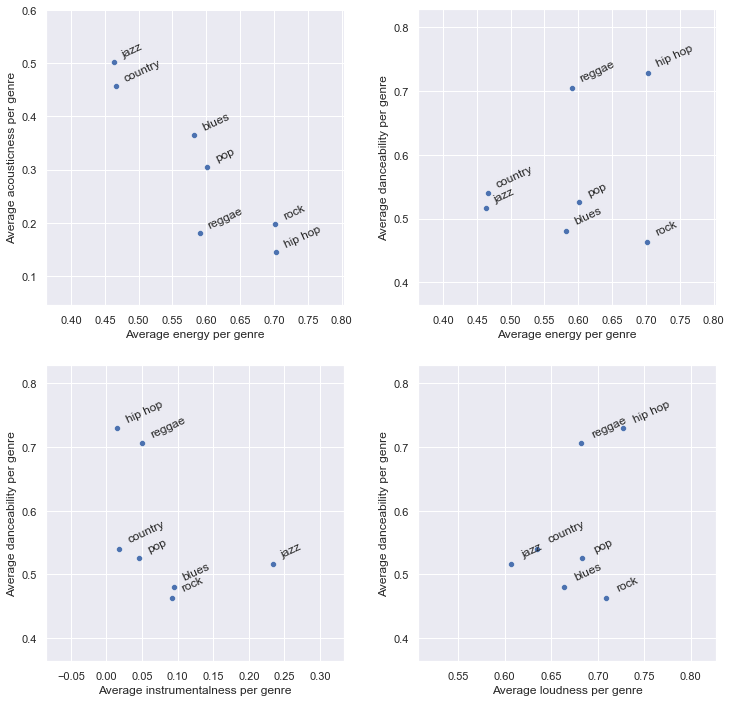

In [24]:
def plot_genres_by_two_measurements(measurement1:str, measurement2:str) -> None:
    """
    Takes the name of two columns and creates a scatterplot. In the plot, each genre is
    included. The point for each genre is set to the average of the columns for all the songs
    in the genre.
    Parmas:
        measurement1: str - string representing the name of the first column used (used as x)
        measurement2: str - string representing the name of the 2nd column used (used as y)
    Return:
        None
    """

    unique_genre = list(df['genre'].unique())

    avg_m1 = np.zeros(len(unique_genre))
    avg_m2 = np.zeros(len(unique_genre))

    for i in unique_genre:
        avg_m1[unique_genre.index(i)] = df[df['genre'] == i][measurement1].mean()
        avg_m2[unique_genre.index(i)] = df[df['genre'] == i][measurement2].mean()

    sns.scatterplot(x = avg_m1, y = avg_m2)

    for i in range(len(unique_genre)):
        plt.text(x = avg_m1[i] + 0.01, y = avg_m2[i] + 0.01, s = unique_genre[i], rotation = 25)


    plt.xlim(min(avg_m1)-0.1,max(avg_m1)+0.1)
    plt.ylim(min(avg_m2)-0.1,max(avg_m2)+0.1)
    xlabel = "Average "+ measurement1 + " per genre"
    plt.xlabel(xlabel)
    ylabel = "Average "+ measurement2 + " per genre"
    plt.ylabel(ylabel)
    
sns.set_theme()
plt.figure(1, figsize=(12, 12))
plt.subplots_adjust(wspace=0.25)

plt.subplot(2,2,1)
plot_genres_by_two_measurements('energy', 'acousticness')
plt.subplot(2,2,2)
plot_genres_by_two_measurements('energy', 'danceability')
plt.subplot(2,2,3)
plot_genres_by_two_measurements('instrumentalness', 'danceability')
plt.subplot(2,2,4)
plot_genres_by_two_measurements('loudness', 'danceability')

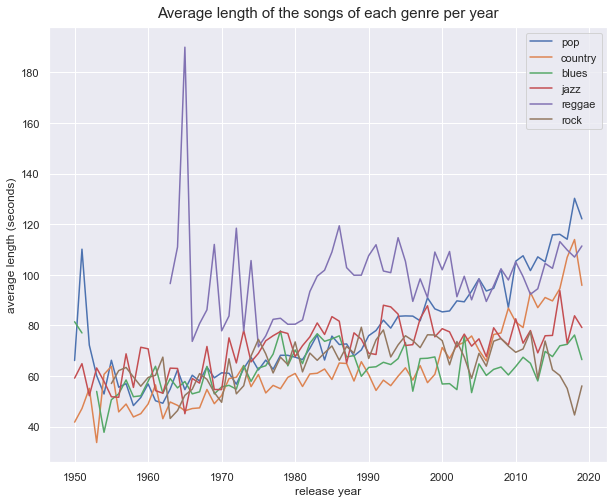

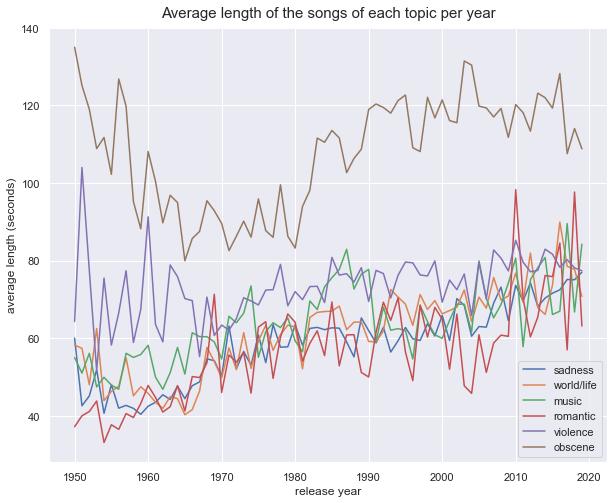

In [25]:
unique_genre = list(df['genre'].unique())
unique_years = list(df['release_date'].unique())
unique_topic = list(df['topic'].unique())

def extract_mean_len_per_genre_per_year():
    """
    Extract an array with the average len for the songs in each genre.
    Params:
        None
    Returns:
        time_series: np.array - an array with the size (no. of genres x
        no. of years) that contains the average len for the songs in each
        genre for each year.
    """
    time_series = np.zeros((len(unique_genre), len(unique_years)))
    i_counter = 0
    for i in unique_genre:
        j_counter = 0
        for j in unique_years:
            copy = df.loc[(df['release_date'] == j) & (df['genre'] == i)]
            time_series[i_counter][j_counter] = copy['len'].mean()
            j_counter += 1
        i_counter += 1
    return time_series

def extract_mean_len_per_topic_per_year():
    """
    Extract an array with the average len for the songs in each topic.
    Params:
        None
    Returns:
        time_series: np.array - an array with the size (no. of topic x
        no. of years) that contains the average len for the songs in each
        topic for each year.
    """
    time_series = np.zeros((len(unique_topic), len(unique_years)))
    i_counter = 0
    for i in unique_topic:
        j_counter = 0
        for j in unique_years:
            copy = df.loc[(df['release_date'] == j) & (df['topic'] == i)]
            time_series[i_counter][j_counter] = copy['len'].mean()
            j_counter += 1
        i_counter += 1
    return time_series

plt.figure(figsize = (10,8))
plt.title("Average length of the songs of each genre per year", size=15, pad=10.0)
plt.xlabel("release year")
plt.ylabel("average length (seconds)")


ts = extract_mean_len_per_genre_per_year()
for i in range(0, 6):
    plt.plot(list(df['release_date'].unique()), ts[i], label = unique_genre[i])

plt.legend()
plt.show()


plt.figure(figsize = (10,8))
plt.title("Average length of the songs of each topic per year", size=15, pad=10.0)
plt.xlabel("release year")
plt.ylabel("average length (seconds)")


ts = extract_mean_len_per_topic_per_year()
for i in range(0, 6):
    plt.plot(list(df['release_date'].unique()), ts[i], label = unique_topic[i])

plt.legend()
plt.show()

## Interactive Charts

The user is able to see the distribution of a word in lyrics over the years. The default word is 'rock'. The chart updates while the user is typing.

In [26]:
"""
Plots the distribution of a certain word over the years.
"""
import datetime
import numpy as np
import pandas as pd

import plotly.graph_objects as go
from ipywidgets import widgets

year_unique = df['release_date'].unique()

def adapt(change):
    """
    A function that updates the data from the chart based on the input of the user.
    Similar to an EventHandler.
    Params:
        change: any 
    Returns:
        None    
    """
    new_df = df.loc[df['lyrics'].str.contains(word.value)]
    
    count_by_year = []
    for i in year_unique:
        count_by_year.append(new_df[new_df['release_date'] == i].shape[0])
    
    g.data[0].y = count_by_year
    return new_df

word = widgets.Text(
    description='Word:   '
)

container = widgets.HBox(children=[word])

initial_df = df.loc[df['lyrics'].str.contains('rock')]

count_by_year = []
for i in year_unique:
    count_by_year.append(initial_df[initial_df['release_date'] == i].shape[0])

        
histo = go.Figure(data=[go.Bar(x = year_unique, y = count_by_year)])

g = go.FigureWidget(data=histo)
g.layout.title = 'Number of Unique Songs that Contain a Certain Word by Year'
g.layout.xaxis.title = 'Year'
g.layout.yaxis.title = 'Number of Songs that Contain the Queried Word'
word.observe(adapt, names="value")

widgets.VBox([g, container])

    'data': [{'type': 'bar',
              'uid': 'fbe366d3-16da-46ab-a5a0-856b7…

The user is able to see the distribution of songs in genre for each decade. The decade is chosen using the slider. One decade is considered from xxx0 to xxx9. The chart is updating after the slider's position is changed. The default value is 1950.

In [27]:
"""
Plots the genre distribution for a decade.
If 1950 is selected, the genre distribution will be plotted for the years 1950...1959.
Use the slider to set the year. Default value is 1950s.
"""

genre_list = df['genre'].unique()

def adapt_2(change):
    """
    A function that updates the data from the chart based on the input of the user.
    Similar to an EventHandler.
    Params:
        change: any 
    Returns:
        None    
    """
    new_df = df[df['release_date'] > year.value]
    new_df = new_df[new_df['release_date'] < year.value + 10]
    genre_unique_new_df = new_df['genre'].unique()
    for genre in genre_list:
        if genre not in genre_unique_new_df:
            new_df = pd.concat([new_df, pd.DataFrame.from_records({'genre': genre}, index = [0])])
    g.data[0].x = new_df['genre']
    return new_df

year = widgets.IntSlider(
    value=1950,
    min=1950,
    max=2010,
    step=10,
    description='Years:',
    continuous_update=False
)

container = widgets.HBox(children=[year])

initial_df = df[df['release_date'] > 1950]
initial_df = initial_df[initial_df['release_date'] < 1950 + 10]

for genre in genre_list:
    if genre not in initial_df['genre'].unique():
        initial_df = pd.concat([initial_df, pd.DataFrame.from_records({'genre': genre}, index = [0])])
        
histo = go.Figure(data=[go.Histogram(x=initial_df['genre'])])

g = go.FigureWidget(data=histo)
g.layout.title = 'Genre Distribution by Decades'
g.layout.xaxis.title = 'Music Genre'
g.layout.yaxis.title = 'Number of Songs Recorded'
year.observe(adapt_2, names="value")

widgets.VBox([g, container])

    'data': [{'type': 'histogram',
              'uid': '7869369f-ccd5-47f3-b2c9…

Plots the number of songs that contain a certain word in their lyrics by genre. Default value plotted is 'rock'.

In [28]:
"""
Plots the number of songs that contain a certain word in their lyrics by genre.
Default value plotted is 'rock'.
"""
import datetime
import numpy as np
import pandas as pd

import plotly.graph_objects as go
from ipywidgets import widgets

genre_unique = df['genre'].unique()

# TODO change the name of the function; 3 functions with the same name
def adapt_3(change):
    """
    A function that updates the data from the chart based on the input of the user.
    Similar to an EventHandler.
    Params:
        change: any 
    Returns:
        None    
    """
    new_df = df.loc[df['lyrics'].str.contains(word.value)]
    
    count_by_genre = []
    for i in genre_unique:
        count_by_genre.append(new_df[new_df['genre'] == i].shape[0])
    
    g.data[0].y = count_by_genre
    return new_df

word = widgets.Text(
    description='Word:   '
)

container = widgets.HBox(children=[word])

initial_df = df.loc[df['lyrics'].str.contains('rock')]

count_by_genre = []
for i in genre_unique:
    count_by_genre.append(initial_df[initial_df['genre'] == i].shape[0])

        
histo = go.Figure(data=[go.Bar(x = genre_unique, y = count_by_genre)])

g = go.FigureWidget(data=histo)
g.layout.title = 'Number of Unique Songs that Contain a Certain Word'
g.layout.xaxis.title = 'Music Genre'
g.layout.yaxis.title = 'Number of Songs that Contain the Queried Word'
word.observe(adapt_3, names="value")

widgets.VBox([g, container])

    'data': [{'type': 'bar',
              'uid': '1f88b0fb-0198-457e-845e-e2c15…

In [29]:
label1 = { "pop": 0, "country": 1, "blues": 2, "jazz": 3, "reggae": 4, "rock":  5, "hip hop": 6}

def label_1(row):
    return label1[row['genre']]

df['label1'] = df.apply(lambda row: label_1(row), axis = 1)

In [30]:
label2 = { "sadness": 0, "world/life": 1, "music": 2, "romantic": 3, "violence": 4, "obscene":  5, "night/time": 6, "feelings": 7}

def label_2(row):
    return label2[row['topic']]

df['label2'] = df.apply(lambda row: label_2(row), axis = 1)

In [31]:
df2 = pd.DataFrame()
df2['lyrics'] = df['lyrics']
df2['label1'] = df['label1']
df2['label2'] = df['label2']

In [32]:
sound_features = []
for index,row in df.iterrows():
    row_features = []
    row_features.append(row['dating'])
    row_features.append(row['violence'])
    row_features.append(row['world/life'])
    row_features.append(row['night/time'])
    row_features.append(row['shake the audience'])
    row_features.append(row['family/gospel'])
    row_features.append(row['romantic'])
    row_features.append(row['communication'])
    row_features.append(row['obscene'])
    row_features.append(row['music'])
    row_features.append(row['movement/places'])
    row_features.append(row['light/visual perceptions'])
    row_features.append(row['family/spiritual'])
    row_features.append(row['like/girls'])
    row_features.append(row['sadness'])
    row_features.append(row['feelings'])
    sound_features.append(row_features)
df2['features'] = sound_features

In [33]:
#genre by lyrics
gl = []
#genre by characteristics
gc= []
#topic by lyrics
tl = []
#topic by characteristics
tc = []


# Classification
- We did a Genre Classification and a Topic Classifications.
- One by lyrics and one by characteristics for each.
- We used 4 models from sklearn and a custom NN for each of the classifications in order to find the best results and compare the methods.
- The 4 models used were Logistic Regression, Bernoulli, MultinomialNB and LinearSVC.
- We visualised all of the results with a confusion matrix.
- For the custom NN we also had plots for validation accuracy and loss during training. 

# Classification by Lyrics
- For the Classifications by lyrics we needed turn the lyrics into something that could be an input for our models.
- For the input for the 4 sklearn models we used TfidfVectorizer.
- For the input for the custom NN we used keras tokenizer and turned the lyrics into padded sequences

In [34]:
vectorizer = TfidfVectorizer(ngram_range=(1, 3), min_df=10)
data = df['lyrics']
features = vectorizer.fit_transform(data).toarray()
X1 = features
# print(X1.shape)

In [35]:
X = df['lyrics']
num_words = X.shape[0]
embed_dim = 32
tokenizer = Tokenizer(num_words=num_words)
tokenizer.fit_on_texts(X)
word_index = tokenizer.word_index
sequences = tokenizer.texts_to_sequences(X)
length = []
for i in sequences:
    length.append(len(i))
# print(np.max(length))

In [36]:
X = pad_sequences (sequences, padding = 'post')

## Genre Classification by Lyrics
- The first idea was to do a genre classification by lyrics as that was something we had done before.
- The problem was that in our experience such classifications did not have good results.
- We tried all 5 models to see if we can get any decent results.
- The features from the vectorizer and the labels were first split into a Train set and a Validation/Test set with 20% of samples in the Validation/Test set.
- The Validation/Test set was then split evenly into a Validation and a Test Set.

In [37]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X1, df.label1, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

### Logistic Regression

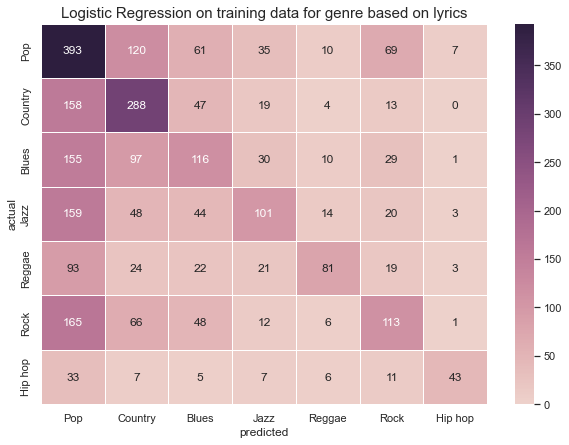

Accuracy: 0.4001


In [38]:
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train, y_train)
yv_predicted = lr.predict(X_val)
score = lr.score(X_val, y_val)
gl.append(score)

cm = pd.DataFrame(confusion_matrix(y_val, yv_predicted), 
                  index = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                  columns = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

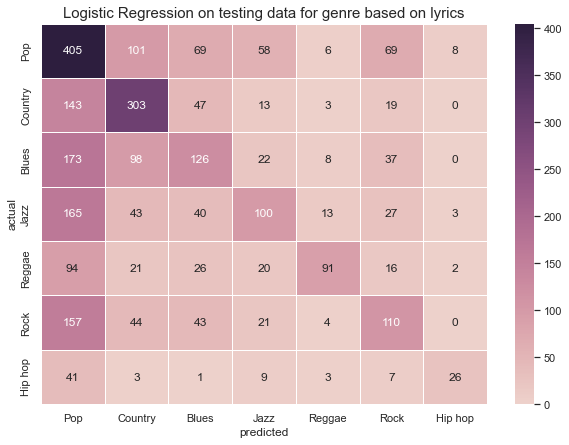

Accuracy: 0.4091


In [39]:
yt_predicted = lr.predict(X_test)
score = lr.score(X_test, y_test)
gl.append(score)

cm = pd.DataFrame(confusion_matrix(y_test, yt_predicted), 
                  index = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                  columns = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Bernoulli

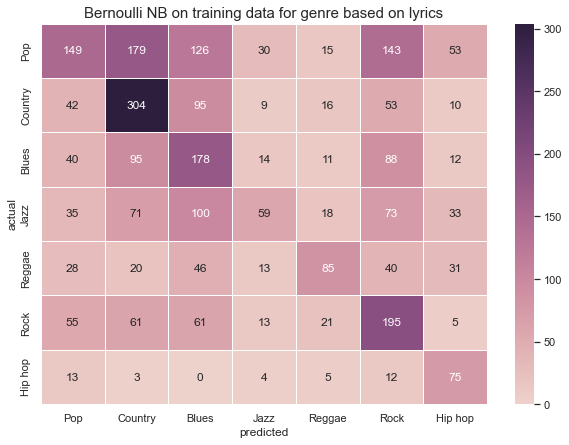

Accuracy: 0.3683


In [40]:
brn = BernoulliNB()
brn.fit(X_train, y_train)
y_predicted = brn.predict(X_val)
score = brn.score(X_val,y_val)
gl.append(score)


df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli NB on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

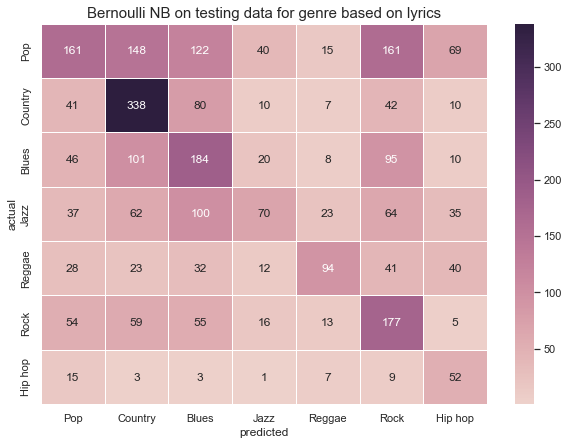

Accuracy: 0.3791


In [41]:
predicted = brn.predict(X_test)
score = brn.score(X_test, y_test)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli NB on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Multinomial NB

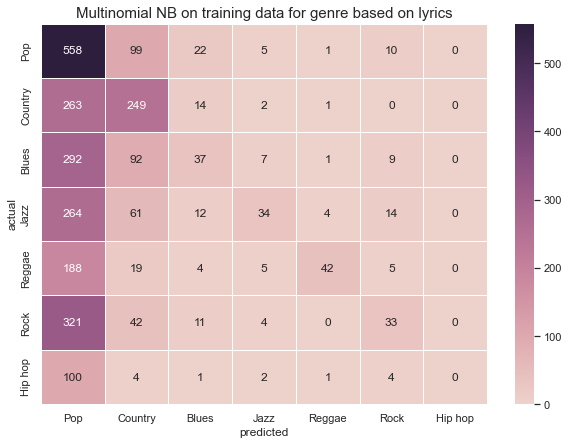

Accuracy: 0.3359


In [42]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])


plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

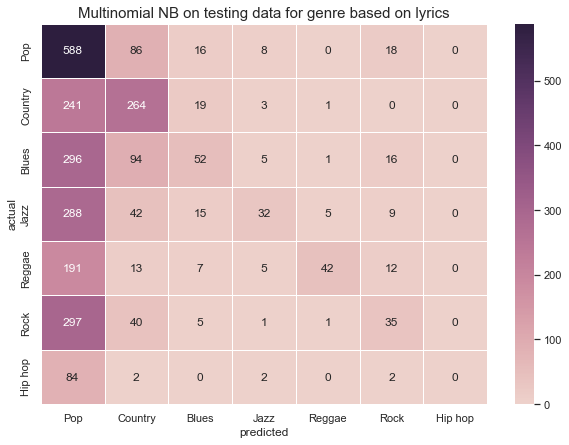

Accuracy: 0.3569


In [43]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Linear SVC

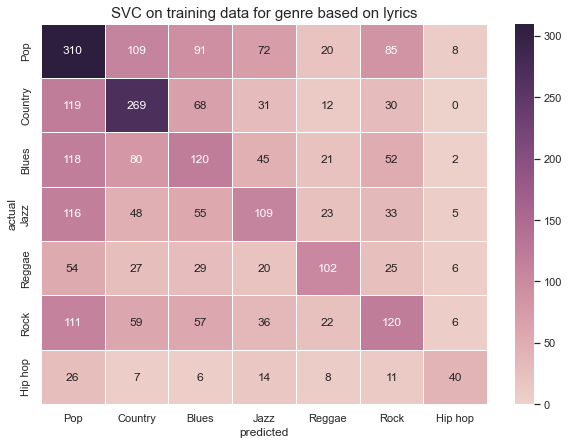

Accuracy: 0.3772


In [44]:
clf = LinearSVC()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

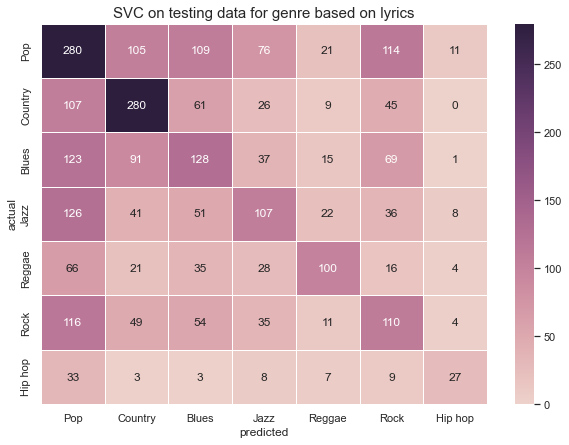

Accuracy: 0.3636


In [45]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
gl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### NN

In [46]:
y = df['label1'] 

In [47]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

In [48]:
#model
def build_model(nr_labels, length):
    model = Sequential()
    model.add(Embedding(num_words, embed_dim, input_length = length))
    model.add(LSTM(32, return_sequences=True))
    model.add(GlobalMaxPool1D())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(nr_labels, activation='sigmoid'))
    return model

def build_compiled_model(length):
    model = build_model(nr_labels=7, length = length)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


model = build_compiled_model(np.max(length))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 199, 32)           907904    
                                                                 
 lstm (LSTM)                 (None, 199, 32)           8320      
                                                                 
 global_max_pooling1d (Globa  (None, 32)               0         
 lMaxPooling1D)                                                  
                                                                 
 dense (Dense)               (None, 64)                2112      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 7)                 455       
                                                        

In [49]:
#train model
history = model.fit(x=X_train, y=y_train, epochs=5, validation_data=(X_val, y_val), shuffle=True)

Epoch 1/5
710/710 [==============================] - 30s 40ms/step - loss: 1.7567 - accuracy: 0.2827 - val_loss: 1.6082 - val_accuracy: 0.3472
Epoch 2/5
710/710 [==============================] - 27s 38ms/step - loss: 1.5122 - accuracy: 0.4127 - val_loss: 1.5424 - val_accuracy: 0.3832
Epoch 3/5
710/710 [==============================] - 26s 37ms/step - loss: 1.2922 - accuracy: 0.5268 - val_loss: 1.5938 - val_accuracy: 0.3881
Epoch 4/5
710/710 [==============================] - 27s 37ms/step - loss: 1.1024 - accuracy: 0.6113 - val_loss: 1.6928 - val_accuracy: 0.3828
Epoch 5/5
710/710 [==============================] - 26s 37ms/step - loss: 0.9304 - accuracy: 0.6797 - val_loss: 1.8517 - val_accuracy: 0.3740


In [50]:
#make predictions
y_pred = np.argmax(model.predict(X_val), axis=1)

On validation data:
Accuracy: 0.3740


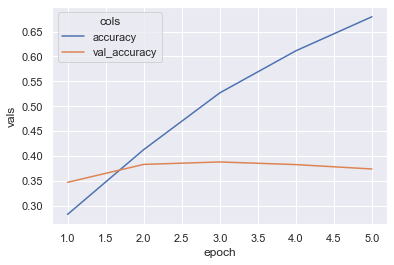

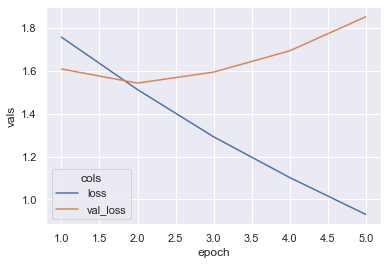

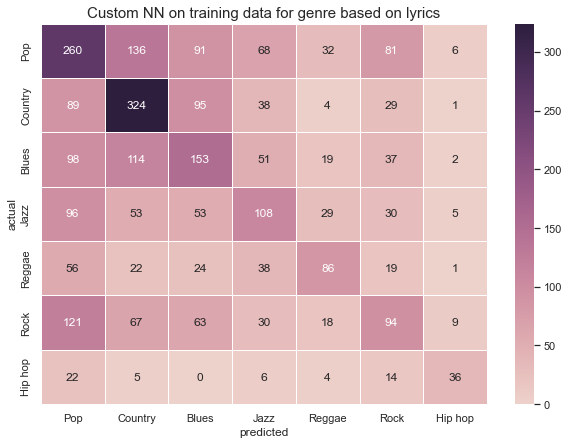

In [51]:
print('On validation data:')
print('Accuracy: %.4f' % accuracy_score(y_val, y_pred))
gl.append(accuracy_score(y_val, y_pred))
# plot graphs
metrics_df = pd.DataFrame(history.history).reset_index().rename(columns={"index": "epoch"})
metrics_df['epoch'] = metrics_df['epoch'] + 1
acc_df = metrics_df[['epoch', 'accuracy', 'val_accuracy']].melt('epoch', var_name='cols', value_name='vals')
loss_df = metrics_df[['epoch', 'loss', 'val_loss']].melt('epoch', var_name='cols', value_name='vals')
sns.lineplot(data=acc_df, x='epoch', y='vals', hue='cols')
plt.show()
sns.lineplot(data=loss_df, x='epoch', y='vals', hue='cols')
plt.show()

# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_val, y_pred), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on training data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

In [52]:
pred = np.argmax(model.predict(X_test), axis=1)

On test data:
Accuracy: 0.3485


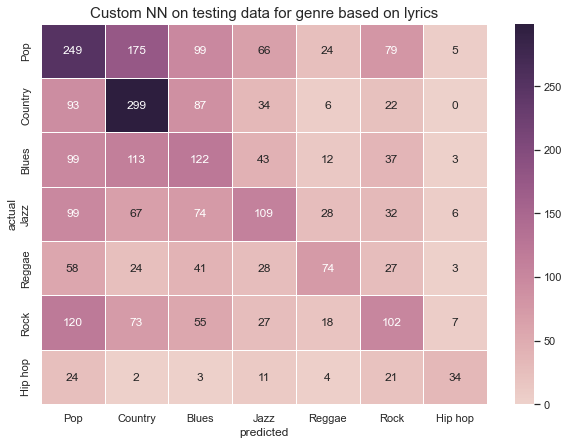

In [53]:
print('On test data:')
print('Accuracy: %.4f' % accuracy_score(y_test, pred))
gl.append(accuracy_score(y_test, pred))
# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_test, pred), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"],
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on testing data for genre based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

- None of the models used yielded any decent results.

## Topic Classification by Lyrics
- Next we tried to do a Topic Classification by Lyrics using the same xact methods.

In [54]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X1, df.label2, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

### Logistic Regression

2837


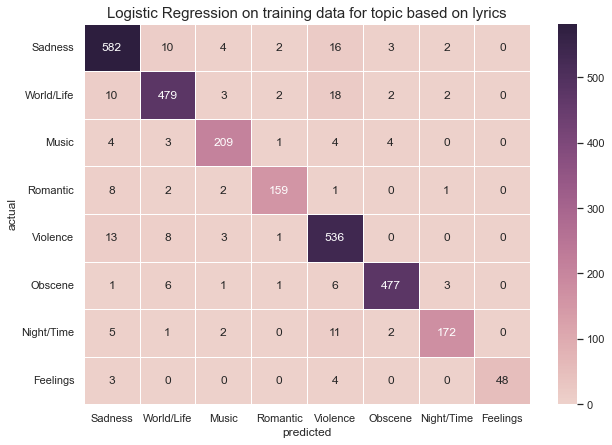

Accuracy: 0.9383


In [55]:
lr = LogisticRegression(solver='liblinear')
lr.fit(X_train, y_train)
yv_predicted = lr.predict(X_val)
score = lr.score(X_val, y_val)
tl.append(score)

cm = pd.DataFrame(confusion_matrix(y_val, yv_predicted), 
                  index = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"],
                  columns = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
print(sum(sum(confusion_matrix(y_val,yv_predicted))))
plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

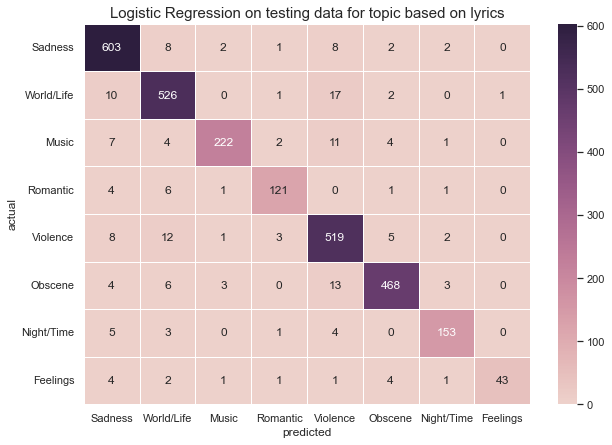

Accuracy: 0.9355


In [56]:
yt_predicted = lr.predict(X_test)
score = lr.score(X_test, y_test)
tl.append(score)
cm = pd.DataFrame(confusion_matrix(y_test, yt_predicted), 
                  index = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"],
                  columns = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

### Bernoulli

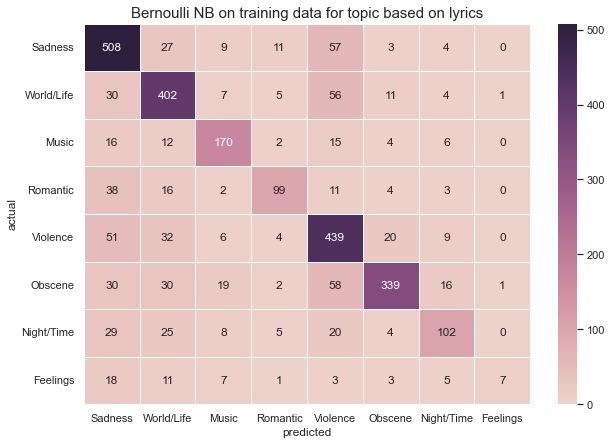

Accuracy: 0.7282


In [57]:
brn = BernoulliNB()
brn.fit(X_train, y_train)
y_predicted = brn.predict(X_val)
score = brn.score(X_val,y_val)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted),
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"],
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli NB on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

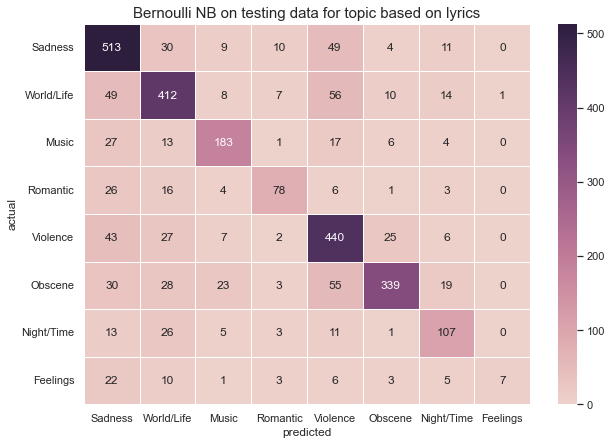

Accuracy: 0.7326


In [58]:
predicted = brn.predict(X_test)
score = brn.score(X_test, y_test)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted),
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"],
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli NB on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

### Multinomial NB

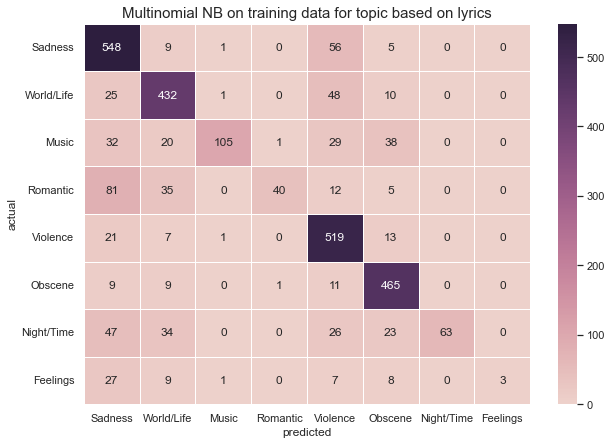

Accuracy: 0.7667


In [59]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted),
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

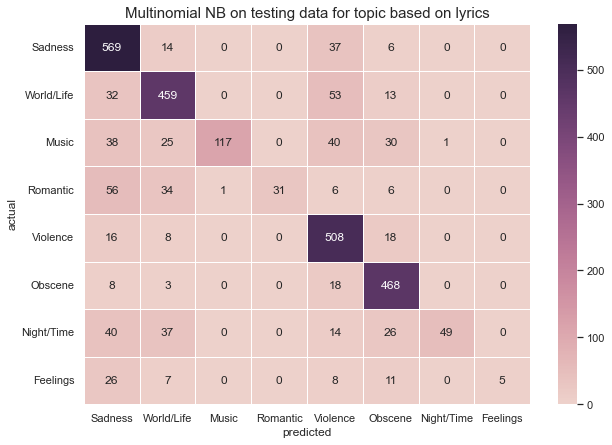

Accuracy: 0.7773


In [60]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

### Linear SVC

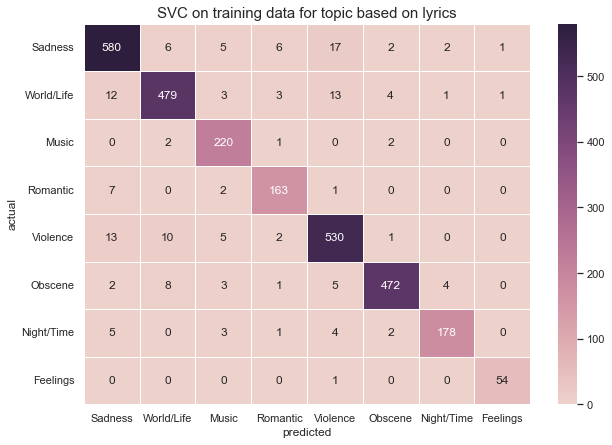

Accuracy: 0.9432


In [61]:
clf = LinearSVC()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

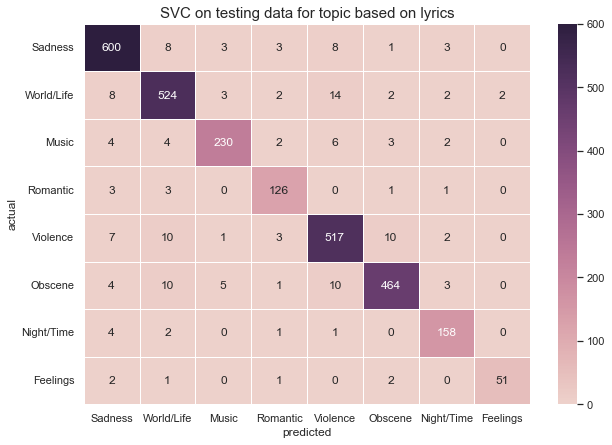

Accuracy: 0.9408


In [62]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
tl.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()
print("Accuracy: " + "{:.4f}".format(score))

### NN

In [63]:
y = df['label2']

In [64]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

In [65]:
#model
def build_model(nr_labels, length):
    model = Sequential()
    model.add(Embedding(num_words, embed_dim, input_length = length))
    model.add(LSTM(32, return_sequences=True))
    model.add(GlobalMaxPool1D())
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.1))
    model.add(Dense(nr_labels, activation='sigmoid'))
    return model

def build_compiled_model(length):
    model = build_model(nr_labels=8, length = length)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


model = build_compiled_model(np.max(length))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 199, 32)           907904    
                                                                 
 lstm_1 (LSTM)               (None, 199, 32)           8320      
                                                                 
 global_max_pooling1d_1 (Glo  (None, 32)               0         
 balMaxPooling1D)                                                
                                                                 
 dense_2 (Dense)             (None, 64)                2112      
                                                                 
 dropout_1 (Dropout)         (None, 64)                0         
                                                                 
 dense_3 (Dense)             (None, 8)                 520       
                                                      

In [66]:
#train model
history = model.fit(x=X_train, y=y_train, epochs=5, validation_data=(X_val, y_val), shuffle=True)

Epoch 1/5
710/710 [==============================] - 28s 37ms/step - loss: 1.3810 - accuracy: 0.4898 - val_loss: 0.8955 - val_accuracy: 0.6863
Epoch 2/5
710/710 [==============================] - 26s 36ms/step - loss: 0.6080 - accuracy: 0.7856 - val_loss: 0.5448 - val_accuracy: 0.8019
Epoch 3/5
710/710 [==============================] - 26s 36ms/step - loss: 0.3408 - accuracy: 0.8789 - val_loss: 0.4972 - val_accuracy: 0.8435
Epoch 4/5
710/710 [==============================] - 26s 36ms/step - loss: 0.1947 - accuracy: 0.9389 - val_loss: 0.5096 - val_accuracy: 0.8509
Epoch 5/5
710/710 [==============================] - 26s 37ms/step - loss: 0.1151 - accuracy: 0.9658 - val_loss: 0.4383 - val_accuracy: 0.8720


In [67]:
#make predictions
y_pred = np.argmax(model.predict(X_val), axis=1)

On validation data:
Accuracy: 0.87


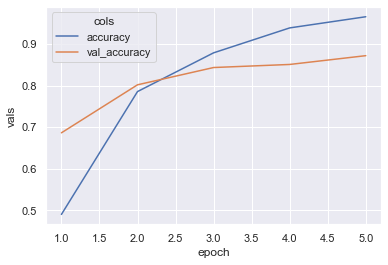

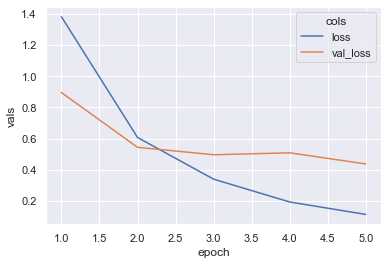

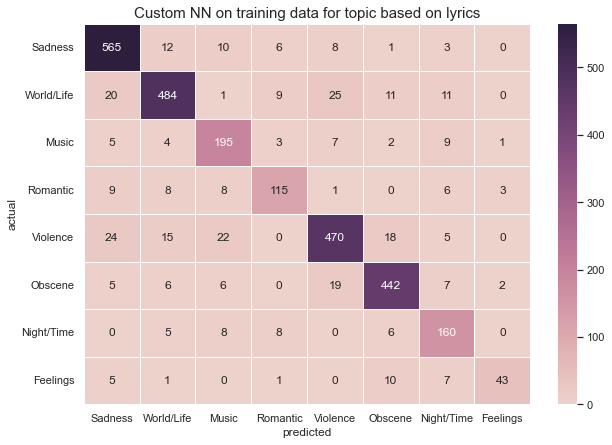

In [68]:
print('On validation data:')
print('Accuracy: %.2f' % accuracy_score(y_val, y_pred))
tl.append(accuracy_score(y_val, y_pred))
# plot graphs
metrics_df = pd.DataFrame(history.history).reset_index().rename(columns={"index": "epoch"})
metrics_df['epoch'] = metrics_df['epoch'] + 1
acc_df = metrics_df[['epoch', 'accuracy', 'val_accuracy']].melt('epoch', var_name='cols', value_name='vals')
loss_df = metrics_df[['epoch', 'loss', 'val_loss']].melt('epoch', var_name='cols', value_name='vals')
sns.lineplot(data=acc_df, x='epoch', y='vals', hue='cols')
plt.show()
sns.lineplot(data=loss_df, x='epoch', y='vals', hue='cols')
plt.show()

# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_val, y_pred), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on training data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

In [69]:
pred = np.argmax(model.predict(X_test), axis=1)

On test data:
Accuracy: 0.87


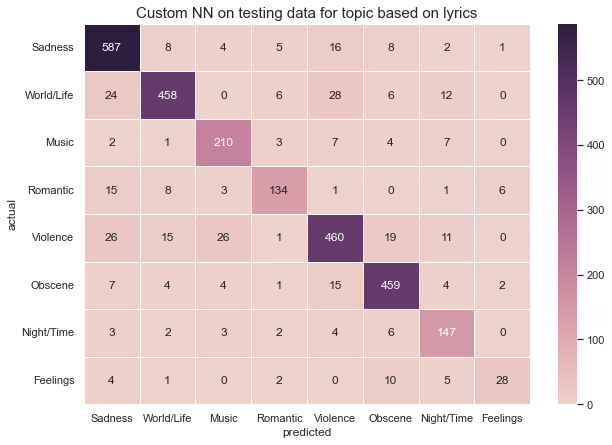

In [70]:
print('On test data:')
print('Accuracy: %.2f' % accuracy_score(y_test, pred))
tl.append(accuracy_score(y_test, pred))
# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_test, pred), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on testing data for topic based on lyrics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

- Some of the models used were clearly not the right choice for this particular task but we decided to keep all the results in order to make a comparison.
- This classification actually worked really well, having an accuracy as high as 94%.

# Classification By Characteristics
- After looking at the data in our dataset we wondered if the column containing values for different characteristics might offer some better results than lyrics did.

In [71]:
X = df2['features']
y = df2['label1']

In [72]:
X = X.tolist()
y = y.tolist()

In [73]:
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

## Genre Classification by Characteristics
- We continued to used the same models as before but we changed the custom NN to serve our task better.

### Logistic Regression

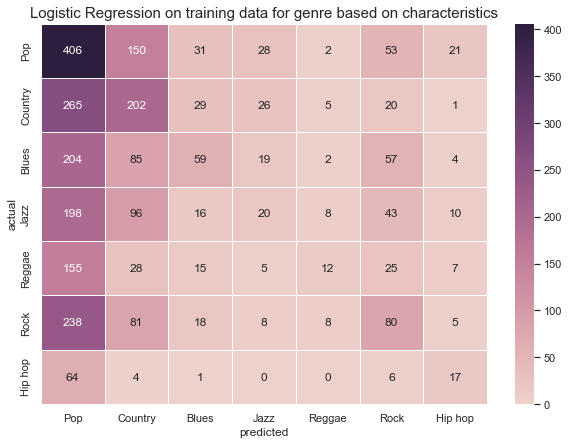

Accuracy: 0.2806


In [74]:
lr = LogisticRegression(solver="sag", penalty='none')
lr.fit(X_train, y_train)
yv_predicted = lr.predict(X_val)
score = lr.score(X_val, y_val)
gc.append(score)

cm = pd.DataFrame(confusion_matrix(y_val, yv_predicted), 
                  index = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                  columns = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
# print(sum(sum(confusion_matrix(y_val,yv_predicted))))
plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot=True, linewidths =1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

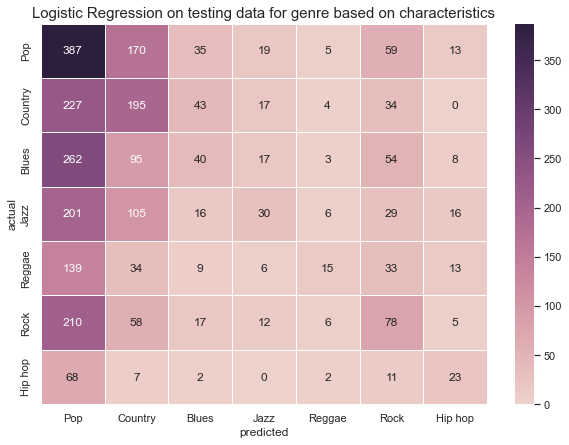

Accuracy: 0.2706


In [75]:
yt_predicted = lr.predict(X_test)
score = lr.score(X_test, y_test)
gc.append(score)

cm = pd.DataFrame(confusion_matrix(y_test, yt_predicted), 
                  index = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                  columns = ["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on testing data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Bernoulli

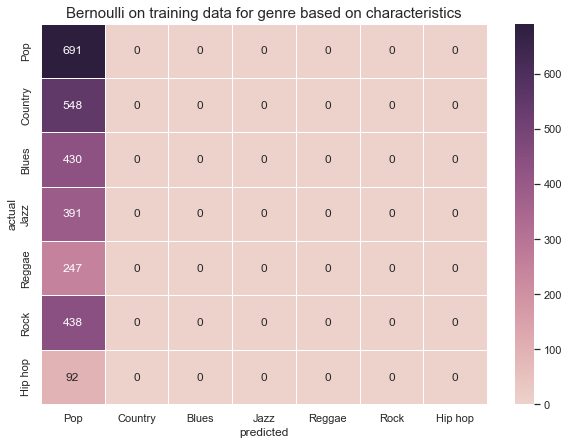

Accuracy: 0.2436


In [76]:
brn = BernoulliNB()
brn.fit(X_train, y_train)
y_predicted = brn.predict(X_val)
score = brn.score(X_val,y_val)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

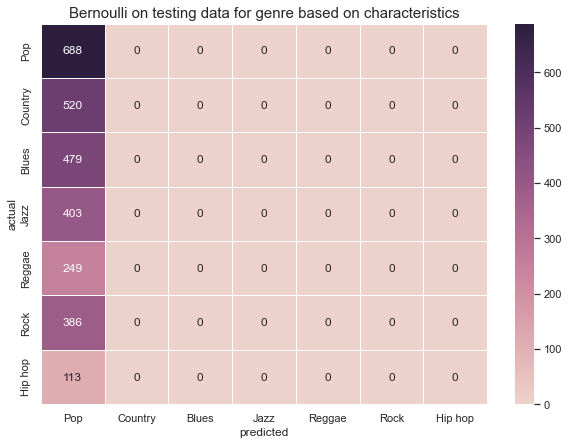

Accuracy: 0.2424


In [77]:
predicted = brn.predict(X_test)
score = brn.score(X_test, y_test)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli on testing data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Multinomial NB

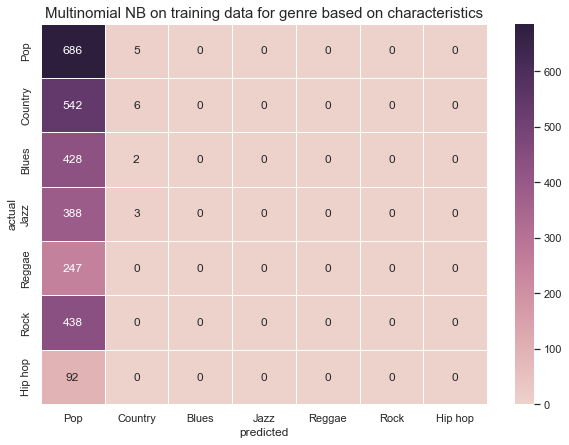

Accuracy: 0.2439


In [78]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

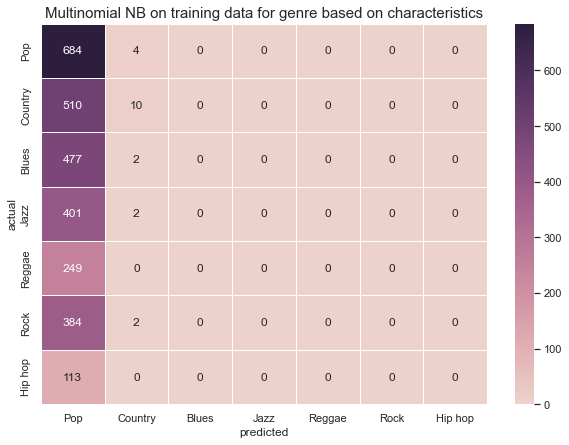

Accuracy: 0.2445


In [79]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Linear SVC

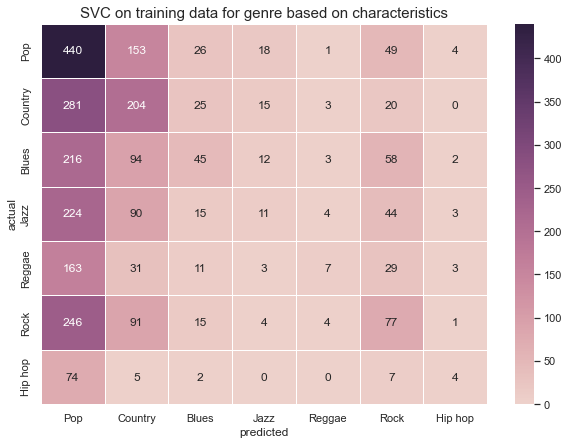

Accuracy: 0.2778


In [80]:
clf = LinearSVC()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

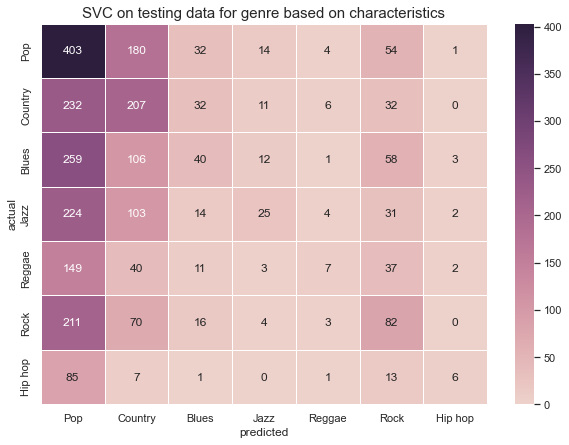

Accuracy: 0.2713


In [81]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
gc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on testing data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### NN

In [82]:
def build_model(nr_labels):
    model = Sequential()
    model.add(Dense(32, activation='relu',input_shape=(16,)))
    model.add(Dense(nr_labels, activation='softmax'))

    return model

def build_compiled_model(length):
    model = build_model(nr_labels=7)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


model = build_compiled_model(np.max(length))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 32)                544       
                                                                 
 dense_5 (Dense)             (None, 7)                 231       
                                                                 
Total params: 775
Trainable params: 775
Non-trainable params: 0
_________________________________________________________________


In [83]:
#train model
history = model.fit(x=X_train, y=y_train, epochs=5, validation_data=(X_val, y_val), shuffle=True)

Epoch 1/5
710/710 [==============================] - 1s 1ms/step - loss: 1.7989 - accuracy: 0.2563 - val_loss: 1.7658 - val_accuracy: 0.2608
Epoch 2/5
710/710 [==============================] - 1s 961us/step - loss: 1.7428 - accuracy: 0.2704 - val_loss: 1.7523 - val_accuracy: 0.2693
Epoch 3/5
710/710 [==============================] - 1s 901us/step - loss: 1.7332 - accuracy: 0.2798 - val_loss: 1.7477 - val_accuracy: 0.2728
Epoch 4/5
710/710 [==============================] - 1s 979us/step - loss: 1.7298 - accuracy: 0.2826 - val_loss: 1.7448 - val_accuracy: 0.2785
Epoch 5/5
710/710 [==============================] - 1s 975us/step - loss: 1.7266 - accuracy: 0.2850 - val_loss: 1.7431 - val_accuracy: 0.2838


In [84]:
#make predictions
y_pred = np.argmax(model.predict(X_val), axis=1)

On validation data:
Accuracy: 0.28


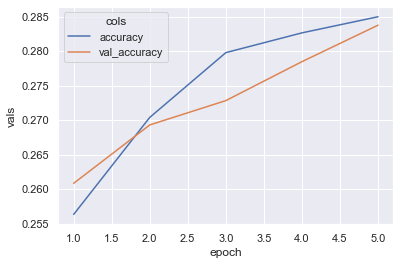

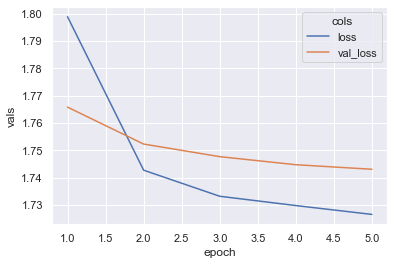

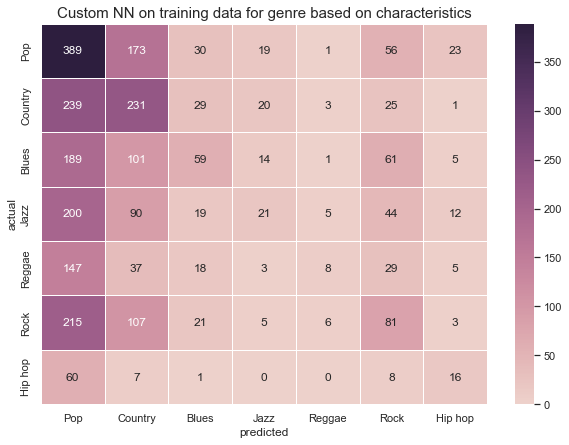

In [85]:
print('On validation data:')
print('Accuracy: %.2f' % accuracy_score(y_val, y_pred))
gc.append(accuracy_score(y_val, y_pred))
# plot graphs
metrics_df = pd.DataFrame(history.history).reset_index().rename(columns={"index": "epoch"})
metrics_df['epoch'] = metrics_df['epoch'] + 1
acc_df = metrics_df[['epoch', 'accuracy', 'val_accuracy']].melt('epoch', var_name='cols', value_name='vals')
loss_df = metrics_df[['epoch', 'loss', 'val_loss']].melt('epoch', var_name='cols', value_name='vals')
sns.lineplot(data=acc_df, x='epoch', y='vals', hue='cols')
plt.show()
sns.lineplot(data=loss_df, x='epoch', y='vals', hue='cols')
plt.show()

# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_val, y_pred), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on training data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

In [86]:
pred = np.argmax(model.predict(X_test), axis=1)

On test data:
Accuracy: 0.27


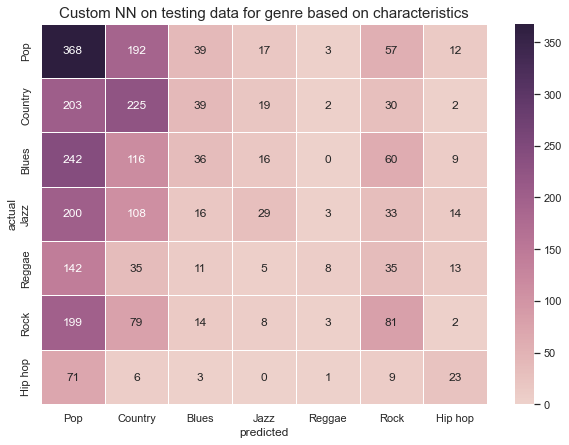

In [87]:
print('On test data:')
print('Accuracy: %.2f' % accuracy_score(y_test, pred))
gc.append(accuracy_score(y_test, pred))
# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_test, pred), 
                     index=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"], 
                     columns=["Pop","Country","Blues","Jazz","Reggae","Rock", "Hip hop"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on testing data for genre based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()


- The results from this classification for genre were even worse than the results from the classification by lyrics.

## Topic Classification by Characteristics
- Even tho the last classification had really bad results, we thought that a classification by characteristics might work better for topic than for genre.

In [88]:
y = df2['label2']
y = y.tolist()
X_train, X_val_test, y_train, y_val_test = train_test_split(X, y, test_size = 0.2)
X_val, X_test, y_val, y_test = train_test_split(X_val_test, y_val_test, test_size = 0.5)

### Logistic Regression

E:\Altele2\Anaconda\envs\DataVisualization\lib\site-packages\sklearn\linear_model\_sag.py:352: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



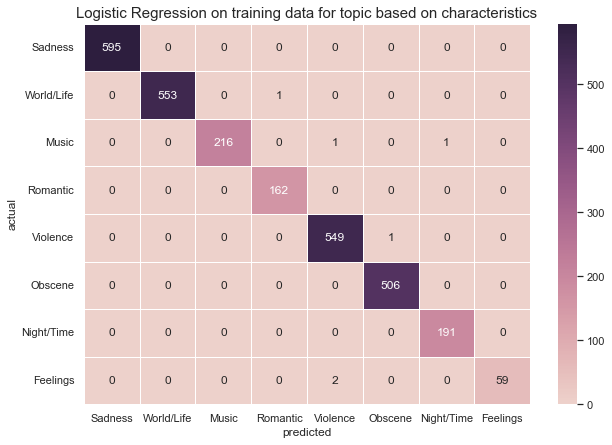

Accuracy: 0.9979


In [89]:
lr = LogisticRegression(solver="sag", penalty='none')
lr.fit(X_train, y_train)
yv_predicted = lr.predict(X_val)
score = lr.score(X_val, y_val)
tc.append(score)

cm = pd.DataFrame(confusion_matrix(y_val, yv_predicted), 
                  index = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                  columns = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

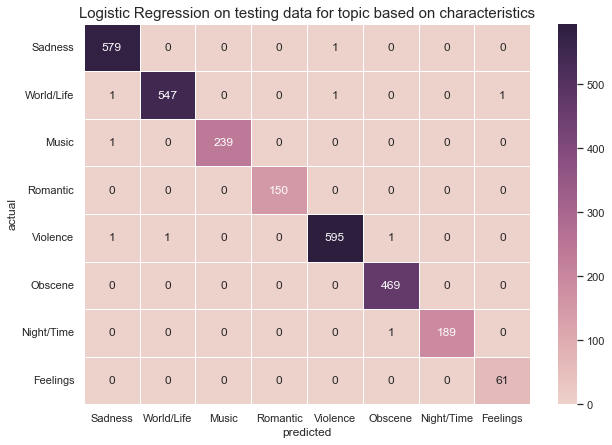

Accuracy: 0.9968


In [90]:
yt_predicted = lr.predict(X_test)
score = lr.score(X_test, y_test)
tc.append(score)

cm = pd.DataFrame(confusion_matrix(y_test, yt_predicted), 
                  index = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                  columns = ["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Logistic Regression on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Bernouli

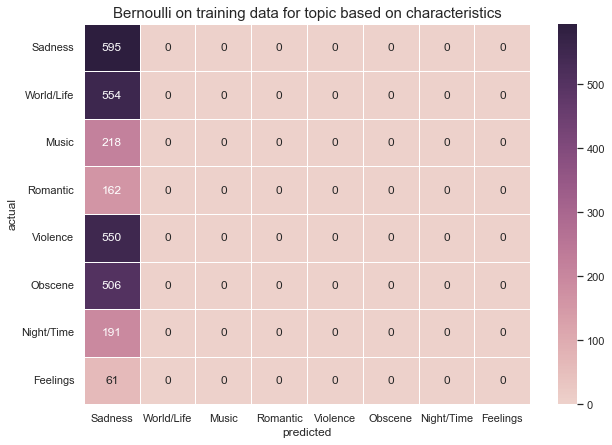

Accuracy: 0.2097


In [91]:
brn = BernoulliNB()
brn.fit(X_train, y_train)
y_predicted = brn.predict(X_val)
score = brn.score(X_val,y_val)
tc.append(score)


df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

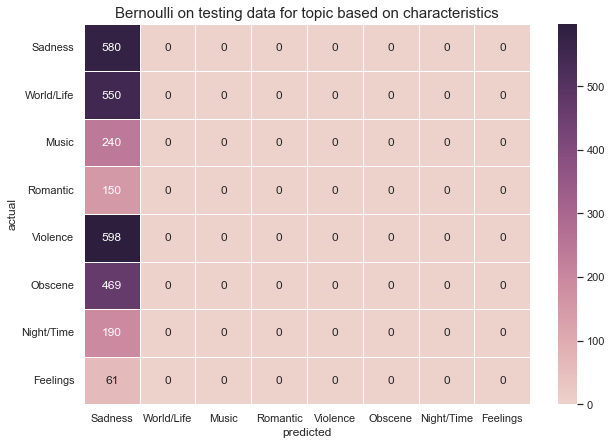

Accuracy: 0.2044


In [92]:
predicted = brn.predict(X_test)
score = brn.score(X_test, y_test)
tc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Bernoulli on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Multinomial NB

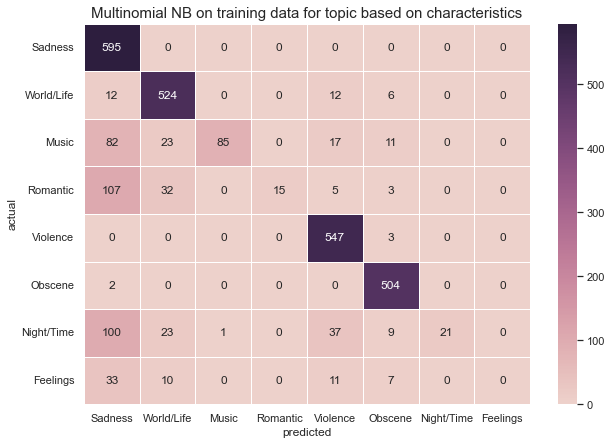

Accuracy: 0.8075


In [93]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
tc.append(score)


df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

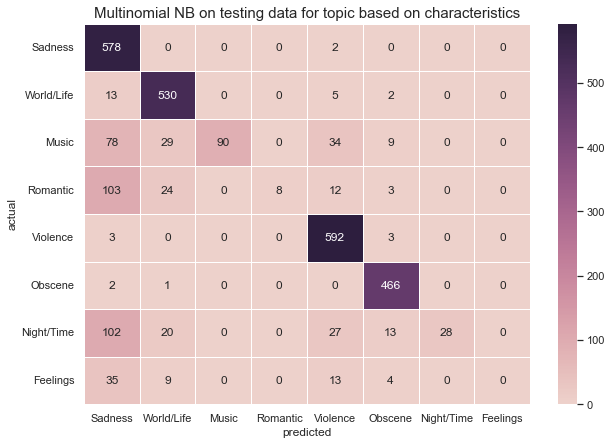

Accuracy: 0.8076


In [94]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
tc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Multinomial NB on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### Linear SVC

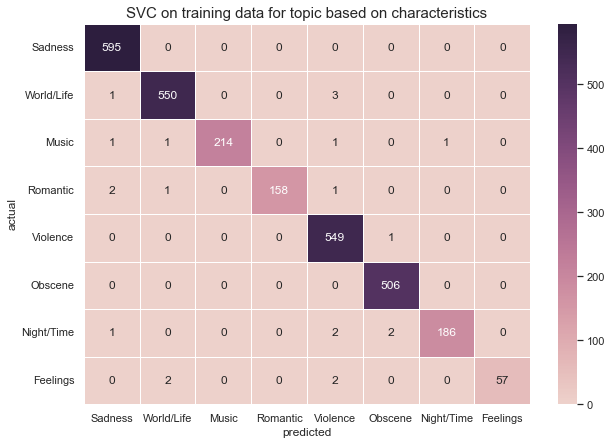

Accuracy: 0.9922


In [95]:
clf = LinearSVC()
clf.fit(X_train, y_train)
y_predicted = clf.predict(X_val)
score = clf.score(X_val,y_val)
tc.append(score)


df_cm = pd.DataFrame(confusion_matrix(y_val, y_predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])

plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

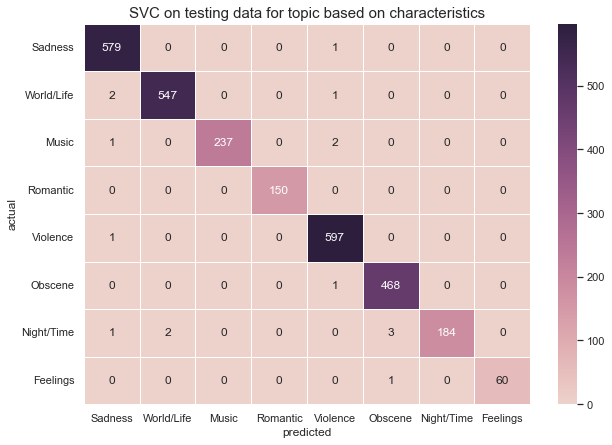

Accuracy: 0.9944


In [96]:
predicted = clf.predict(X_test)
score = clf.score(X_test, y_test)
tc.append(score)

df_cm = pd.DataFrame(confusion_matrix(y_test, predicted), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("SVC on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

print("Accuracy: " + "{:.4f}".format(score))

### NN

In [97]:
def build_model(nr_labels):
    model = Sequential()
    model.add(Dense(32, activation='relu',input_shape=(16,)))
    model.add(Dense(nr_labels, activation='softmax'))

    return model

def build_compiled_model(length):
    model = build_model(nr_labels=8)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model


model = build_compiled_model(np.max(length))
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 32)                544       
                                                                 
 dense_7 (Dense)             (None, 8)                 264       
                                                                 
Total params: 808
Trainable params: 808
Non-trainable params: 0
_________________________________________________________________


In [98]:
#train model
history = model.fit(x=X_train, y=y_train, epochs=5, validation_data=(X_val, y_val), shuffle=True)

Epoch 1/5
710/710 [==============================] - 1s 1ms/step - loss: 0.9008 - accuracy: 0.8431 - val_loss: 0.2382 - val_accuracy: 0.9676
Epoch 2/5
710/710 [==============================] - 1s 920us/step - loss: 0.1306 - accuracy: 0.9860 - val_loss: 0.0827 - val_accuracy: 0.9884
Epoch 3/5
710/710 [==============================] - 1s 937us/step - loss: 0.0612 - accuracy: 0.9941 - val_loss: 0.0529 - val_accuracy: 0.9930
Epoch 4/5
710/710 [==============================] - 1s 908us/step - loss: 0.0425 - accuracy: 0.9957 - val_loss: 0.0405 - val_accuracy: 0.9947
Epoch 5/5
710/710 [==============================] - 1s 943us/step - loss: 0.0339 - accuracy: 0.9963 - val_loss: 0.0346 - val_accuracy: 0.9951


In [99]:
#make predictions
y_pred = np.argmax(model.predict(X_val), axis=1)

On validation data:
Accuracy: 1.00


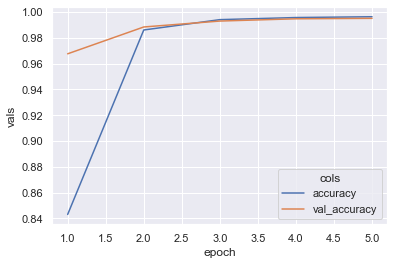

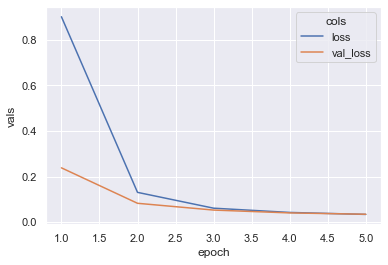

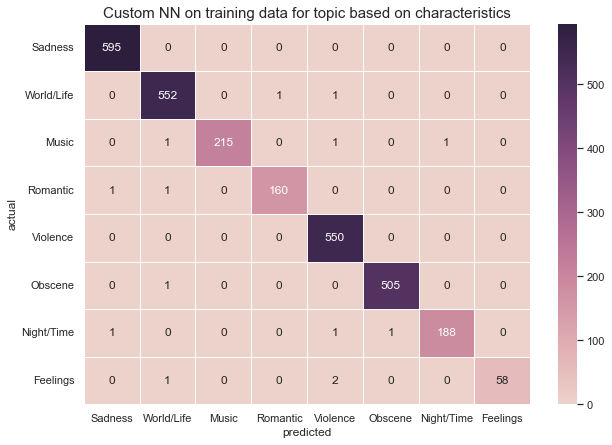

In [100]:
print('On validation data:')
print('Accuracy: %.2f' % accuracy_score(y_val, y_pred))
tc.append(accuracy_score(y_val, y_pred))
# plot graphs
metrics_df = pd.DataFrame(history.history).reset_index().rename(columns={"index": "epoch"})
metrics_df['epoch'] = metrics_df['epoch'] + 1
acc_df = metrics_df[['epoch', 'accuracy', 'val_accuracy']].melt('epoch', var_name='cols', value_name='vals')
loss_df = metrics_df[['epoch', 'loss', 'val_loss']].melt('epoch', var_name='cols', value_name='vals')
sns.lineplot(data=acc_df, x='epoch', y='vals', hue='cols')
plt.show()
sns.lineplot(data=loss_df, x='epoch', y='vals', hue='cols')
plt.show()

# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_val, y_pred), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on training data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

In [101]:
pred = np.argmax(model.predict(X_test), axis=1)

On test data:
Accuracy: 0.99


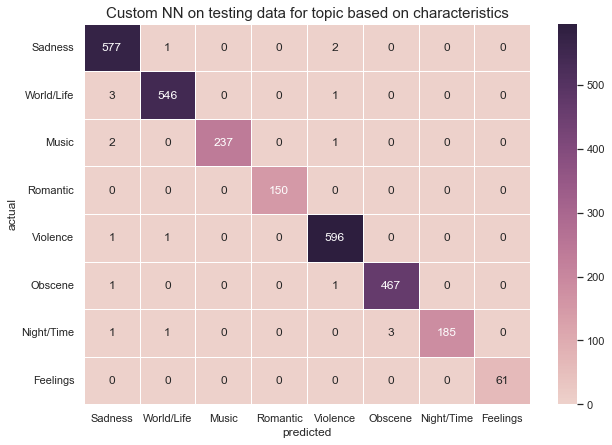

In [102]:
print('On test data:')
print('Accuracy: %.2f' % accuracy_score(y_test, pred))
tc.append(accuracy_score(y_test, pred))
# plot confusion matrix
df_cm = pd.DataFrame(confusion_matrix(y_test, pred), 
                     index=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"], 
                     columns=["Sadness", "World/Life", "Music", "Romantic", "Violence", "Obscene", "Night/Time", "Feelings"])
plt.figure(figsize = (10,7))
ax = sns.heatmap(df_cm, annot = True, linewidths=1, fmt = 'd', cmap = sns.cubehelix_palette(as_cmap = True))
ax.set_title("Custom NN on testing data for topic based on characteristics", size = 15)
ax.set_xlabel("predicted")
ax.set_ylabel("actual")
plt.show()

- In the end the columns with values for characteristics ended up being very good features for a topic classification.
- All models did well but some even yielded a 100% accuracy for both Validation and Test.

In [103]:
column_labels=["Genre by Lyrics", "Topic by Lyrics","Genre by Characteristics", "Topic by Characteristics"]
row_labels = ["Logistic Regression Val Acc", "Logistic Regression Test Acc",
              "Bernoulli Val Acc", "Bernoulli Test Acc",
              "MultinomialNB Val Acc", "MultinomialNB Test Acc",
              "LinearSVC Val Acc", "LinearSVC Test Acc",
              "NN Val Acc", "NN Test Acc"]

In [104]:
gl = [round(x,2) for x in gl]
tl = [round(x,2) for x in tl]
gc = [round(x,2) for x in gc]
tc = [round(x,2) for x in tc]

In [105]:
gl = [str(a) for a in gl]
tl = [str(a) for a in tl]
gc = [str(a) for a in gc]
tc = [str(a) for a in tc]

In [106]:
results = pd.DataFrame(index = row_labels, columns = column_labels)
results["Genre by Lyrics"] = gl
results["Topic by Lyrics"] = tl
results["Genre by Characteristics"] = gc
results["Topic by Characteristics"] = tc

# Results
- We put all of the results into one table to be able to compare all of them.

In [107]:

results.style.set_properties(**{'text-align': 'center'})

,Genre by Lyrics,Topic by Lyrics,Genre by Characteristics,Topic by Characteristics
Logistic Regression Val Acc,0.4,0.94,0.28,1.0
Logistic Regression Test Acc,0.41,0.94,0.27,1.0
Bernoulli Val Acc,0.37,0.73,0.24,0.21
Bernoulli Test Acc,0.38,0.73,0.24,0.2
MultinomialNB Val Acc,0.34,0.77,0.24,0.81
MultinomialNB Test Acc,0.36,0.78,0.24,0.81
LinearSVC Val Acc,0.38,0.94,0.28,0.99
LinearSVC Test Acc,0.36,0.94,0.27,0.99
NN Val Acc,0.37,0.87,0.28,1.0
NN Test Acc,0.35,0.87,0.27,0.99


In [108]:
def vis_results(x, y, title='Results', ylabel='Model'):
    x = pd.to_numeric(x, errors = "coerce")
    fig, axes = plt.subplots()
    axes.hlines(y, xmin=0, xmax=x)
    
    axes.plot(x,y, "o")
    axes.set_xlim(0,1)

    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel('Accuracy')
    plt.yticks(y)

- We used lollipop charts to visualise the results for each classification and clearly see which model did the best in each case

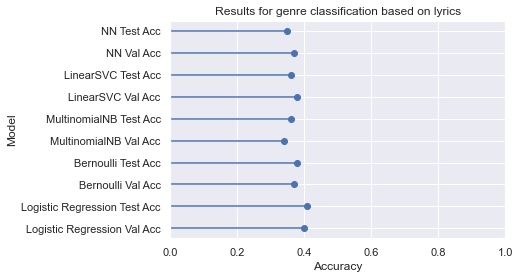

In [109]:
# results =  results.sort_values(by = ["Genre by Lyrics"])
vis_results(y=results.index, x = results["Genre by Lyrics"], title ="Results for genre classification based on lyrics")

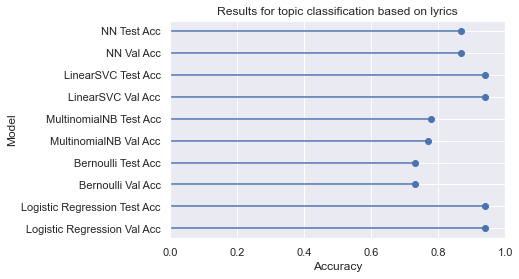

In [110]:
# results =  results.sort_values(by = ["Topic by Lyrics"])
vis_results(y=results.index, x = results["Topic by Lyrics"], title ="Results for topic classification based on lyrics")

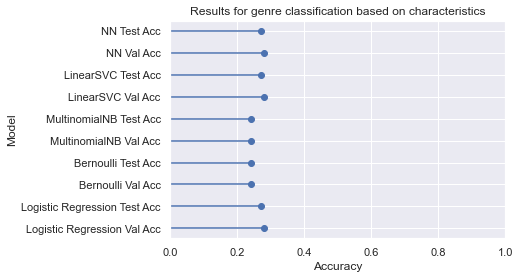

In [111]:
# results =  results.sort_values(by = ["Genre by Characteristics"])
vis_results(y=results.index, x = results["Genre by Characteristics"], title ="Results for genre classification based on characteristics")

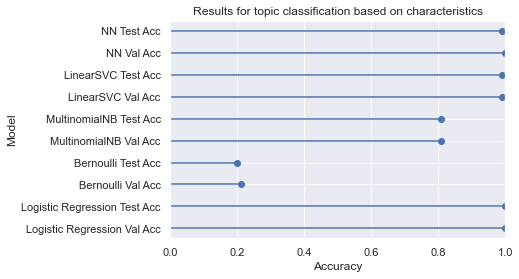

In [112]:
# results =  results.sort_values(by = ["Topic by Characteristics"])
vis_results(y=results.index, x = results["Topic by Characteristics"], title ="Results for topic classification based on characteristics")

- We also did lollipop charts to visualise the best use case for each model.

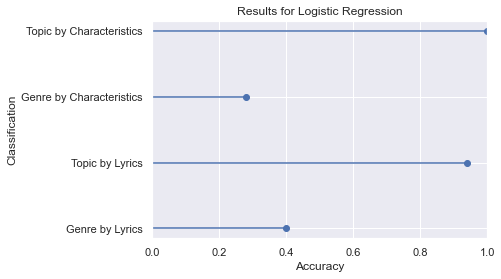

In [113]:
vis_results(x=results.iloc[0], y = results.columns, ylabel='Classification', title = "Results for Logistic Regression")

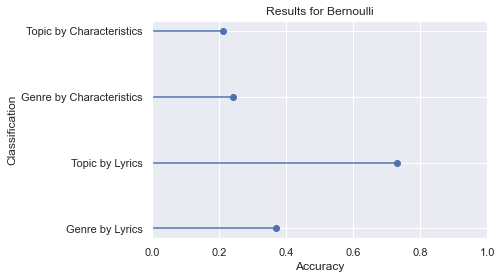

In [114]:
vis_results(x=results.iloc[2], y = results.columns, ylabel='Classification', title = "Results for Bernoulli")

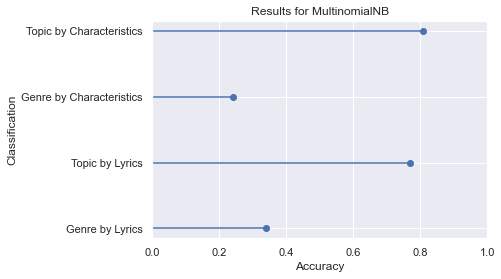

In [115]:
vis_results(x=results.iloc[4], y = results.columns, ylabel='Classification', title = "Results for MultinomialNB")

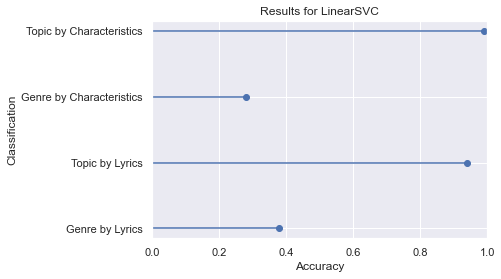

In [116]:
vis_results(x=results.iloc[6], y = results.columns, ylabel='Classification', title = "Results for LinearSVC")

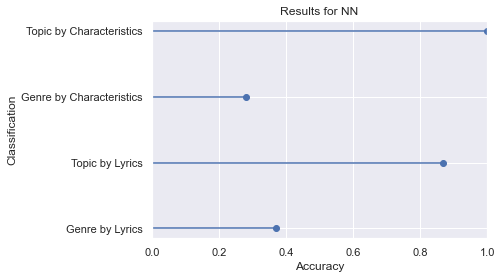

In [117]:
vis_results(x=results.iloc[8], y = results.columns, ylabel='Classification', title = "Results for NN")